<img align="left" src = https://project.lsst.org/sites/default/files/Rubin-O-Logo_0.png width=250 style="padding: 10px"> 
<br>
<b> DM-46681-Adding extendedness flag to diffim measurement </b><br>
Notebook comparing the use of the extendedness flag in <code>diffim</code> measurement. <br> <br>

Contact author: Audrey Budlong <br>
Last verified to run: 14 November 2024 <br>
LSST Science Pipelines version: <code>d_2024_11_12</code> <br>
Additional notes: run with a local ap_verfify run of <code>ap_verify_ci_hits2015</code> <br>

## Run details

Baseline run using <code>d_2024_11_12</code>.

### Extednedness Plugin Calculation
The plugin associated with extendedness computes <code>chi^2</code> as <code>((T_obj - T_psf)/T_psf^exponent)^2</code>, where <code>T_obj</code> is the sum of <code>Ixx</code> and <code>Iyy</code> moments of the object, and <code>T_psf</code> is the sum of <code>Ixx</code> and <code>Iyy</code> moments of the PSF. The exponent is configurable. The measure of being a galaxy is then <code>1 - exp(-0.5*chi^2)</code>.

### Table of Contents

1. Main package imports
2. Configuring data access
3. APBD Source Comparison
4. Visualizing APDB Source Comparison
5. Checking Dipole Classification + Extendedness Value Classification <br>
   a. Dipole Flag Checks in diaPipe <br>
   b. Checking values of extendedness based on dipole classification
6. Splitting Catalog into Dipole vs Non-Dipoles + Extendedness Flag True vs. False for Image Cutout Creation
7. Extendedness Value Distribution (Visual)
8. Generating Image Cutouts
9. Visualizing Manual Categorization of Image Cutouts
10. Source Location Split by Type & Extendedness Flag
11. Visualizing Flags

### 1. Main package imports

In [1]:
import lsst.afw.display as afwDisplay
import lsst.geom as geom
import gc
import glob
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import os
import pandas as pd
import seaborn as sns
import warnings

from astropy.table import Table
from astropy.visualization import make_lupton_rgb
from astropy.wcs import WCS
from IPython.display import Image, display
from lsst.afw.image import MultibandExposure
from lsst.analysis.ap import apdb, nb_utils
from lsst.analysis.ap import plotImageSubtractionCutouts as plotISC
from lsst.daf.butler import Butler
from sqlalchemy import select, func

%matplotlib inline

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
plt.style.use('ggplot')
plt.rcParams['axes.facecolor'] = 'whitesmoke'

warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

### 2. Configuring data access

In [2]:
repo_main = '/Users/audrey/Documents/LSST/code/ap_verify-runs/DECam/d_2024_11_12/repo/butler.yaml'
repo_updated = '/Users/audrey/Documents/LSST/code/ap_verify-runs/DECam/d_2024_11_12-DM46681/repo/butler.yaml'
collections = 'ap_verify-output'
instrument = 'DECam'
skymap = 'decam_rings_v1'

butler_main = Butler(repo_main, collections=collections)
butler_updated = Butler(repo_updated, collections=collections)

dbType = 'sqlite'
dbName_main = '/Users/audrey/Documents/LSST/code/ap_verify-runs/DECam/d_2024_11_12/association.db'
dbName_updated = '/Users/audrey/Documents/LSST/code/ap_verify-runs/DECam/d_2024_11_12-DM46681/association.db'

reader_main = apdb.ApdbSqliteQuery(dbName_main, instrument=instrument)
reader_updated = apdb.ApdbSqliteQuery(dbName_updated, instrument=instrument)

In [3]:
len(reader_main._tables), len(reader_updated._tables)

(6, 6)

In [4]:
main_run = {
    'repo': repo_main,
    'collections': collections,
    'instrument': instrument,
    'skymap': skymap,
    'butler': butler_main,
    'dbType': dbType,
    'dbName': dbName_main,
    'reader': reader_main
}

updated_run = {
    'repo': repo_updated,
    'collections': collections,
    'instrument': instrument,
    'skymap': skymap,
    'butler': butler_updated,
    'dbType': dbType,
    'dbName': dbName_updated,
    'reader': reader_updated
}

In [5]:
main_run['run_name'] = 'Main'
updated_run['run_name'] = 'Updated'

In [6]:
main_run['robjTable'] = main_run['reader'].load_objects()
main_run['rsrcTable'] = main_run['reader'].load_sources()

updated_run['robjTable'] = updated_run['reader'].load_objects()
updated_run['rsrcTable'] = updated_run['reader'].load_sources()

In [7]:
registry_main = butler_main.registry
registry_updated = butler_updated.registry

datarefs_main = list(registry_main.queryDatasets('initial_pvi'))
datarefs_updated = list(registry_updated.queryDatasets('initial_pvi'))

In [8]:
len(datarefs_main), len(datarefs_updated)

(6, 6)

In [9]:
mainSources0 = butler_main.get('goodSeeingDiff_diaSrc', dataId=datarefs_main[0].dataId).asAstropy().to_pandas()
mainSources1 = butler_main.get('goodSeeingDiff_diaSrc', dataId=datarefs_main[1].dataId).asAstropy().to_pandas()
mainSources2 = butler_main.get('goodSeeingDiff_diaSrc', dataId=datarefs_main[2].dataId).asAstropy().to_pandas()
mainSources3 = butler_main.get('goodSeeingDiff_diaSrc', dataId=datarefs_main[3].dataId).asAstropy().to_pandas()
mainSources4 = butler_main.get('goodSeeingDiff_diaSrc', dataId=datarefs_main[4].dataId).asAstropy().to_pandas()
mainSources5 = butler_main.get('goodSeeingDiff_diaSrc', dataId=datarefs_main[5].dataId).asAstropy().to_pandas()
mainSources = pd.concat([mainSources0, mainSources1, mainSources2, mainSources3, mainSources4, mainSources5], ignore_index=True)

In [10]:
(len(mainSources0)+len(mainSources1)+len(mainSources2)+len(mainSources3)+len(mainSources4)+len(mainSources5))==len(mainSources)

True

In [11]:
updatedSources0 = butler_updated.get('goodSeeingDiff_diaSrc', dataId=datarefs_main[0].dataId).asAstropy().to_pandas()
updatedSources1 = butler_updated.get('goodSeeingDiff_diaSrc', dataId=datarefs_main[1].dataId).asAstropy().to_pandas()
updatedSources2 = butler_updated.get('goodSeeingDiff_diaSrc', dataId=datarefs_main[2].dataId).asAstropy().to_pandas()
updatedSources3 = butler_updated.get('goodSeeingDiff_diaSrc', dataId=datarefs_main[3].dataId).asAstropy().to_pandas()
updatedSources4 = butler_updated.get('goodSeeingDiff_diaSrc', dataId=datarefs_main[4].dataId).asAstropy().to_pandas()
updatedSources5 = butler_updated.get('goodSeeingDiff_diaSrc', dataId=datarefs_main[5].dataId).asAstropy().to_pandas()
updatedSources = pd.concat([updatedSources0, updatedSources1, updatedSources2, updatedSources3, updatedSources4, updatedSources5], axis=0)

In [12]:
(len(updatedSources0)+len(updatedSources1)+len(updatedSources2)+len(updatedSources3)+len(updatedSources4)+len(updatedSources5))==len(updatedSources)

True

In [13]:
# Sources with extendedness_flag = True correspond to an extendedness_value of NaN
updatedSourcesExtTrue = updatedSources[updatedSources['base_ClassificationSizeExtendedness_flag']==True]

# Sources with extendedness_flag = False correspond to an extendedness_value > 0
updatedSourcesExtFalse = updatedSources[updatedSources['base_ClassificationSizeExtendedness_flag']==False]

### 3. APBD Source Comparison

In [14]:
selfTest1, selfTest2, selfMatchedTest = nb_utils.compare_sources(repo_main, repo_main, reader_main, reader_main, match_radius=0.01)

785 matched sources; 0 unique to set 1; 3 unique to set 2.


In [15]:
selfTest2

,diaSourceId,visit,detector,diaObjectId,ssObjectId,parentDiaSourceId,ssObjectReassocTime,midpointMjdTai,ra,raErr,dec,decErr,ra_dec_Cov,x,xErr,y,yErr,x_y_Cov,centroid_flag,apFlux,apFluxErr,apFlux_flag,apFlux_flag_apertureTruncated,snr,psfFlux,psfFluxErr,psfRa,psfRaErr,psfDec,psfDecErr,psfFlux_psfRa_Cov,psfFlux_psfDec_Cov,psfRa_psfDec_Cov,psfLnL,psfChi2,psfNdata,psfFlux_flag,psfFlux_flag_edge,psfFlux_flag_noGoodPixels,trailFlux,trailFluxErr,trailRa,trailRaErr,trailDec,trailDecErr,trailLength,trailLengthErr,trailAngle,trailAngleErr,trailFlux_trailRa_Cov,trailFlux_trailDec_Cov,trailFlux_trailLength_Cov,trailFlux_trailAngle_Cov,trailRa_trailDec_Cov,trailRa_trailLength_Cov,trailRa_trailAngle_Cov,trailDec_trailLength_Cov,trailDec_trailAngle_Cov,trailLength_trailAngle_Cov,trailLnL,trailChi2,trailNdata,trail_flag_edge,dipoleMeanFlux,dipoleMeanFluxErr,dipoleFluxDiff,dipoleFluxDiffErr,dipoleRa,dipoleRaErr,dipoleDec,dipoleDecErr,dipoleLength,dipoleLengthErr,dipoleAngle,dipoleAngleErr,dipoleMeanFlux_dipoleFluxDiff_Cov,dipoleMeanFlux_dipoleRa_Cov,dipoleMeanFlux_dipoleDec_Cov,dipoleMeanFlux_dipoleLength_Cov,dipoleMeanFlux_dipoleAngle_Cov,dipoleFluxDiff_dipoleRa_Cov,dipoleFluxDiff_dipoleDec_Cov,dipoleFluxDiff_dipoleLength_Cov,dipoleFluxDiff_dipoleAngle_Cov,dipoleRa_dipoleDec_Cov,dipoleRa_dipoleLength_Cov,dipoleRa_dipoleAngle_Cov,dipoleDec_dipoleLength_Cov,dipoleDec_dipoleAngle_Cov,dipoleLength_dipoleAngle_Cov,dipoleLnL,dipoleChi2,dipoleNdata,scienceFlux,scienceFluxErr,forced_PsfFlux_flag,forced_PsfFlux_flag_edge,forced_PsfFlux_flag_noGoodPixels,snapDiffFlux,snapDiffFluxErr,fpBkgd,fpBkgdErr,ixx,ixxErr,iyy,iyyErr,ixy,ixyErr,ixx_iyy_Cov,ixx_ixy_Cov,iyy_ixy_Cov,ixxPSF,iyyPSF,ixyPSF,shape_flag,shape_flag_no_pixels,shape_flag_not_contained,shape_flag_parent_source,extendedness,reliability,band,isDipole,time_processed,time_withdrawn,bboxSize,pixelFlags,pixelFlags_bad,pixelFlags_cr,pixelFlags_crCenter,pixelFlags_edge,pixelFlags_interpolated,pixelFlags_interpolatedCenter,pixelFlags_offimage,pixelFlags_saturated,pixelFlags_saturatedCenter,pixelFlags_suspect,pixelFlags_suspectCenter,pixelFlags_streak,pixelFlags_streakCenter,pixelFlags_injected,pixelFlags_injectedCenter,pixelFlags_injected_template,pixelFlags_injected_templateCenter,pixelId,instrument
195,88341369835225319,411371,56,88341369835225319,0,0,None,57071.227994,155.124092,NaN,-5.672169,NaN,NaN,825.0,NaN,3719.0,NaN,None,True,-202.152344,486.885986,True,False,5.130067,-611.189392,119.573280,None,None,None,None,None,None,None,None,1670.336304,1681,True,False,False,NaN,None,NaN,None,NaN,None,NaN,None,NaN,None,None,None,None,None,None,None,None,None,None,None,None,None,0,False,NaN,NaN,NaN,NaN,None,None,None,None,NaN,None,NaN,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,NaN,0,1261.817261,111.179581,True,False,False,None,None,None,None,NaN,None,NaN,None,NaN,None,None,None,None,0.119114,-0.000527,-0.000527,True,False,False,False,None,0.019143,g,False,2024-11-13 04:57:30.209,None,10,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,10563275395087,DECam
197,88341369835225321,411371,56,88341369835225321,0,0,None,57071.227994,155.124092,NaN,-5.672169,NaN,NaN,825.0,NaN,3719.0,NaN,None,True,-202.152344,486.885986,True,False,5.130067,-611.189392,119.573280,None,None,None,None,None,None,None,None,1670.336304,1681,True,False,False,NaN,None,NaN,None,NaN,None,NaN,None,NaN,None,None,None,None,None,None,None,None,None,None,None,None,None,0,False,NaN,NaN,NaN,NaN,None,None,None,None,NaN,None,NaN,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,NaN,0,-6.340270,111.172722,True,False,False,None,None,None,None,NaN,None,NaN,None,NaN,None,None,None,None,0.119114,-0.000527,-0.000527,True,False,False,False,None,0.019143,g,False,2024-11-13 04:57:30.209,None,24,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,10563275395087,DECam
429,88

#### Comparing main with updated versions

In [16]:
uniqueMain, uniqueUpdated, matched = nb_utils.compare_sources(repo_main, repo_updated, reader_main, reader_updated)

785 matched sources; 0 unique to set 1; 3 unique to set 2.


In [17]:
uniqueMain

,diaSourceId,visit,detector,diaObjectId,ssObjectId,parentDiaSourceId,ssObjectReassocTime,midpointMjdTai,ra,raErr,dec,decErr,ra_dec_Cov,x,xErr,y,yErr,x_y_Cov,centroid_flag,apFlux,apFluxErr,apFlux_flag,apFlux_flag_apertureTruncated,snr,psfFlux,psfFluxErr,psfRa,psfRaErr,psfDec,psfDecErr,psfFlux_psfRa_Cov,psfFlux_psfDec_Cov,psfRa_psfDec_Cov,psfLnL,psfChi2,psfNdata,psfFlux_flag,psfFlux_flag_edge,psfFlux_flag_noGoodPixels,trailFlux,trailFluxErr,trailRa,trailRaErr,trailDec,trailDecErr,trailLength,trailLengthErr,trailAngle,trailAngleErr,trailFlux_trailRa_Cov,trailFlux_trailDec_Cov,trailFlux_trailLength_Cov,trailFlux_trailAngle_Cov,trailRa_trailDec_Cov,trailRa_trailLength_Cov,trailRa_trailAngle_Cov,trailDec_trailLength_Cov,trailDec_trailAngle_Cov,trailLength_trailAngle_Cov,trailLnL,trailChi2,trailNdata,trail_flag_edge,dipoleMeanFlux,dipoleMeanFluxErr,dipoleFluxDiff,dipoleFluxDiffErr,dipoleRa,dipoleRaErr,dipoleDec,dipoleDecErr,dipoleLength,dipoleLengthErr,dipoleAngle,dipoleAngleErr,dipoleMeanFlux_dipoleFluxDiff_Cov,dipoleMeanFlux_dipoleRa_Cov,dipoleMeanFlux_dipoleDec_Cov,dipoleMeanFlux_dipoleLength_Cov,dipoleMeanFlux_dipoleAngle_Cov,dipoleFluxDiff_dipoleRa_Cov,dipoleFluxDiff_dipoleDec_Cov,dipoleFluxDiff_dipoleLength_Cov,dipoleFluxDiff_dipoleAngle_Cov,dipoleRa_dipoleDec_Cov,dipoleRa_dipoleLength_Cov,dipoleRa_dipoleAngle_Cov,dipoleDec_dipoleLength_Cov,dipoleDec_dipoleAngle_Cov,dipoleLength_dipoleAngle_Cov,dipoleLnL,dipoleChi2,dipoleNdata,scienceFlux,scienceFluxErr,forced_PsfFlux_flag,forced_PsfFlux_flag_edge,forced_PsfFlux_flag_noGoodPixels,snapDiffFlux,snapDiffFluxErr,fpBkgd,fpBkgdErr,ixx,ixxErr,iyy,iyyErr,ixy,ixyErr,ixx_iyy_Cov,ixx_ixy_Cov,iyy_ixy_Cov,ixxPSF,iyyPSF,ixyPSF,shape_flag,shape_flag_no_pixels,shape_flag_not_contained,shape_flag_parent_source,extendedness,reliability,band,isDipole,time_processed,time_withdrawn,bboxSize,pixelFlags,pixelFlags_bad,pixelFlags_cr,pixelFlags_crCenter,pixelFlags_edge,pixelFlags_interpolated,pixelFlags_interpolatedCenter,pixelFlags_offimage,pixelFlags_saturated,pixelFlags_saturatedCenter,pixelFlags_suspect,pixelFlags_suspectCenter,pixelFlags_streak,pixelFlags_streakCenter,pixelFlags_injected,pixelFlags_injectedCenter,pixelFlags_injected_template,pixelFlags_injected_templateCenter,pixelId,instrument,xmatch_dist_arcsec,src2_diaSourceId


In [18]:
# There is always one unique source associated with the second unique set. We are tracking down this error, but it doesn't affect
# the overall result of the source comparison.
uniqueUpdated

,diaSourceId,visit,detector,diaObjectId,ssObjectId,parentDiaSourceId,ssObjectReassocTime,midpointMjdTai,ra,raErr,dec,decErr,ra_dec_Cov,x,xErr,y,yErr,x_y_Cov,centroid_flag,apFlux,apFluxErr,apFlux_flag,apFlux_flag_apertureTruncated,snr,psfFlux,psfFluxErr,psfRa,psfRaErr,psfDec,psfDecErr,psfFlux_psfRa_Cov,psfFlux_psfDec_Cov,psfRa_psfDec_Cov,psfLnL,psfChi2,psfNdata,psfFlux_flag,psfFlux_flag_edge,psfFlux_flag_noGoodPixels,trailFlux,trailFluxErr,trailRa,trailRaErr,trailDec,trailDecErr,trailLength,trailLengthErr,trailAngle,trailAngleErr,trailFlux_trailRa_Cov,trailFlux_trailDec_Cov,trailFlux_trailLength_Cov,trailFlux_trailAngle_Cov,trailRa_trailDec_Cov,trailRa_trailLength_Cov,trailRa_trailAngle_Cov,trailDec_trailLength_Cov,trailDec_trailAngle_Cov,trailLength_trailAngle_Cov,trailLnL,trailChi2,trailNdata,trail_flag_edge,dipoleMeanFlux,dipoleMeanFluxErr,dipoleFluxDiff,dipoleFluxDiffErr,dipoleRa,dipoleRaErr,dipoleDec,dipoleDecErr,dipoleLength,dipoleLengthErr,dipoleAngle,dipoleAngleErr,dipoleMeanFlux_dipoleFluxDiff_Cov,dipoleMeanFlux_dipoleRa_Cov,dipoleMeanFlux_dipoleDec_Cov,dipoleMeanFlux_dipoleLength_Cov,dipoleMeanFlux_dipoleAngle_Cov,dipoleFluxDiff_dipoleRa_Cov,dipoleFluxDiff_dipoleDec_Cov,dipoleFluxDiff_dipoleLength_Cov,dipoleFluxDiff_dipoleAngle_Cov,dipoleRa_dipoleDec_Cov,dipoleRa_dipoleLength_Cov,dipoleRa_dipoleAngle_Cov,dipoleDec_dipoleLength_Cov,dipoleDec_dipoleAngle_Cov,dipoleLength_dipoleAngle_Cov,dipoleLnL,dipoleChi2,dipoleNdata,scienceFlux,scienceFluxErr,forced_PsfFlux_flag,forced_PsfFlux_flag_edge,forced_PsfFlux_flag_noGoodPixels,snapDiffFlux,snapDiffFluxErr,fpBkgd,fpBkgdErr,ixx,ixxErr,iyy,iyyErr,ixy,ixyErr,ixx_iyy_Cov,ixx_ixy_Cov,iyy_ixy_Cov,ixxPSF,iyyPSF,ixyPSF,shape_flag,shape_flag_no_pixels,shape_flag_not_contained,shape_flag_parent_source,extendedness,reliability,band,isDipole,time_processed,time_withdrawn,bboxSize,pixelFlags,pixelFlags_bad,pixelFlags_cr,pixelFlags_crCenter,pixelFlags_edge,pixelFlags_interpolated,pixelFlags_interpolatedCenter,pixelFlags_offimage,pixelFlags_saturated,pixelFlags_saturatedCenter,pixelFlags_suspect,pixelFlags_suspectCenter,pixelFlags_streak,pixelFlags_streakCenter,pixelFlags_injected,pixelFlags_injectedCenter,pixelFlags_injected_template,pixelFlags_injected_templateCenter,pixelId,instrument
195,88341369835225319,411371,56,88341369835225319,0,0,None,57071.227994,155.124092,NaN,-5.672169,NaN,NaN,825.0,NaN,3719.0,NaN,None,True,-202.152344,486.885986,True,False,5.130067,-611.189392,119.573280,None,None,None,None,None,None,None,None,1670.336304,1681,True,False,False,NaN,None,NaN,None,NaN,None,NaN,None,NaN,None,None,None,None,None,None,None,None,None,None,None,None,None,0,False,NaN,NaN,NaN,NaN,None,None,None,None,NaN,None,NaN,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,NaN,0,1261.817261,111.179581,True,False,False,None,None,None,None,NaN,None,NaN,None,NaN,None,None,None,None,0.119114,-0.000527,-0.000527,True,False,False,False,NaN,0.019143,g,False,2024-11-13 04:13:08.390,None,10,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,10563275395087,DECam
197,88341369835225321,411371,56,88341369835225321,0,0,None,57071.227994,155.124092,NaN,-5.672169,NaN,NaN,825.0,NaN,3719.0,NaN,None,True,-202.152344,486.885986,True,False,5.130067,-611.189392,119.573280,None,None,None,None,None,None,None,None,1670.336304,1681,True,False,False,NaN,None,NaN,None,NaN,None,NaN,None,NaN,None,None,None,None,None,None,None,None,None,None,None,None,None,0,False,NaN,NaN,NaN,NaN,None,None,None,None,NaN,None,NaN,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,NaN,0,-6.340270,111.172722,True,False,False,None,None,None,None,NaN,None,NaN,None,NaN,None,None,None,None,0.119114,-0.000527,-0.000527,True,False,False,False,NaN,0.019143,g,False,2024-11-13 04:13:08.390,None,24,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,10563275395087,DECam
429,8835

In [19]:
# matched

### 4. Visualizing APDB Source Comparison

In [20]:
sns.color_palette("Spectral", 20)

[(0.7211072664359862, 0.11649365628604381, 0.28281430219146486),
 (0.8226066897347175, 0.22906574394463664, 0.30680507497116494),
 (0.8853517877739331, 0.3190311418685121, 0.29042675893886966),
 (0.942560553633218, 0.4057670126874279, 0.2682814302191465),
 (0.9693194925028835, 0.5174163783160323, 0.30426758938869664),
 (0.9873125720876587, 0.6473663975394078, 0.3642445213379469),
 (0.9934640522875817, 0.7477124183006535, 0.4352941176470587),
 (0.9953094963475586, 0.8399846212995001, 0.5128027681660899),
 (0.9971549404075356, 0.9118031526336025, 0.6010765090349866),
 (0.9990003844675125, 0.9690119184928874, 0.697039600153787),
 (0.9750096116878124, 0.9900038446751249, 0.7100346020761246),
 (0.9288735101883892, 0.9715494040753557, 0.6380622837370243),
 (0.8565936178392929, 0.942329873125721, 0.6053056516724337),
 (0.7477124183006538, 0.8980392156862746, 0.6274509803921569),
 (0.6334486735870821, 0.8521337946943485, 0.6436755094194541),
 (0.4955017301038063, 0.7981545559400232, 0.6456747404844291),
 (0.3760092272202999, 0.7340253748558246, 0.6581314878892733),
 (0.2800461361014994, 0.6269896193771626, 0.7024221453287197),
 (0.20622837370242214, 0.5201845444059977, 0.7349480968858132),
 (0.2874279123414072, 0.4149942329873126, 0.6851211072664359)]

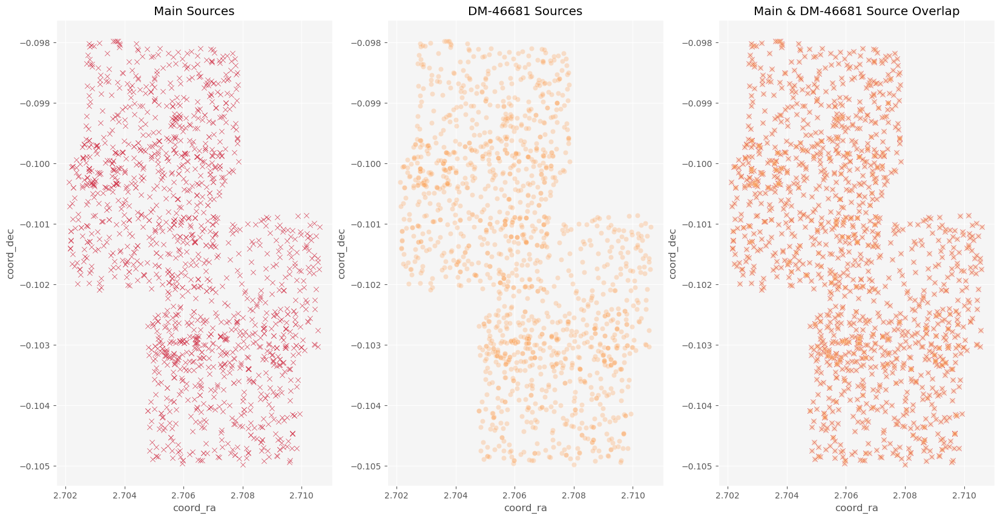

In [21]:
# Full catalogs from DM-46681 and Main (from 'goodSeeingDiff_diaSrc')
f, axes = plt.subplots(1, 3, figsize=(20,10))
sns.scatterplot(data=mainSources, x='coord_ra', y='coord_dec', marker='x', color=sns.color_palette("Spectral", 20)[1], alpha=1.0, ax=axes[0]).set(title=f'Main Sources');
sns.scatterplot(data=updatedSources, x='coord_ra', y='coord_dec', marker='o', color=sns.color_palette("Spectral", 20)[5], alpha=0.3, ax=axes[1]).set(title=f'DM-46681 Sources');
sns.scatterplot(data=mainSources, x='coord_ra', y='coord_dec', marker='x', color=sns.color_palette("Spectral", 20)[1], alpha=1.0, ax=axes[2]).set(title=f'Main & DM-46681 Source Overlap');
sns.scatterplot(data=updatedSources, x='coord_ra', y='coord_dec', marker='o', color=sns.color_palette("Spectral", 20)[5], alpha=0.3, ax=axes[2]);


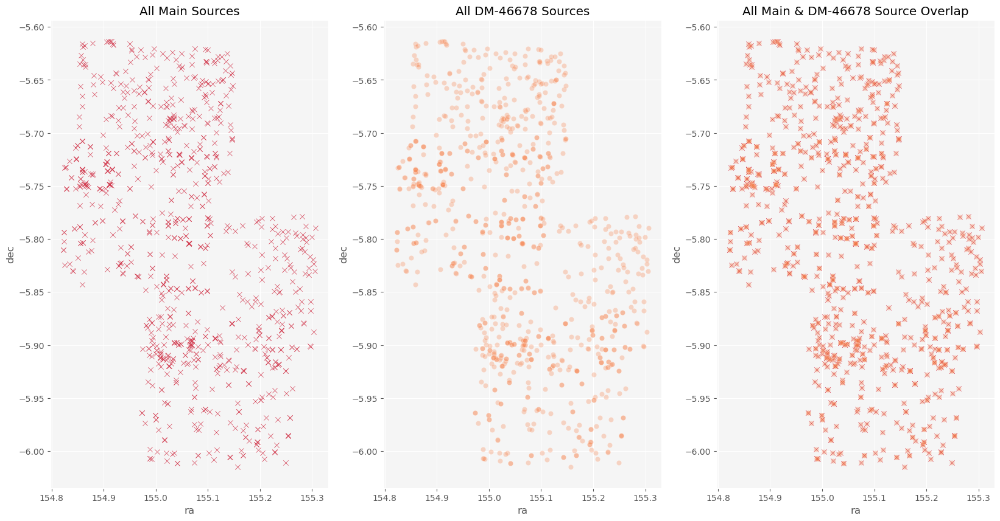

In [22]:
# Full catalogs from Main and DM-46678
f, axes = plt.subplots(1, 3, figsize=(20,10))
sns.scatterplot(data=main_run['rsrcTable'], x='ra', y='dec', marker='x', color=sns.color_palette("Spectral", 20)[1], alpha=1.0, ax=axes[0]).set(title=f'All Main Sources');
sns.scatterplot(data=updated_run['rsrcTable'], x='ra', y='dec', marker='o', color=sns.color_palette("Spectral", 20)[4], alpha=0.3, ax=axes[1]).set(title=f'All DM-46678 Sources');
sns.scatterplot(data=main_run['rsrcTable'], x='ra', y='dec', marker='x', color=sns.color_palette("Spectral", 20)[1], alpha=1.0, ax=axes[2]).set(title=f'All Main & DM-46678 Source Overlap');
sns.scatterplot(data=updated_run['rsrcTable'], x='ra', y='dec', marker='o', color=sns.color_palette("Spectral", 20)[4], alpha=0.3, ax=axes[2]);


### 5. Checking Dipole Classification + Extendedness Value Classification

#### a. Dipole Flag Checks in diaPipe

In [23]:
for c in updatedSources.columns:
    if 'DipoleFit' in c:
        print(c)

ip_diffim_DipoleFit_pos_instFlux
ip_diffim_DipoleFit_pos_instFluxErr
ip_diffim_DipoleFit_neg_instFlux
ip_diffim_DipoleFit_neg_instFluxErr
ip_diffim_DipoleFit_instFlux
ip_diffim_DipoleFit_instFluxErr
ip_diffim_DipoleFit_pos_x
ip_diffim_DipoleFit_pos_y
ip_diffim_DipoleFit_neg_x
ip_diffim_DipoleFit_neg_y
ip_diffim_DipoleFit_x
ip_diffim_DipoleFit_y
ip_diffim_DipoleFit_xErr
ip_diffim_DipoleFit_yErr
ip_diffim_DipoleFit_orientation
ip_diffim_DipoleFit_separation
ip_diffim_DipoleFit_chi2dof
ip_diffim_DipoleFit_nData
ip_diffim_DipoleFit_signalToNoise
ip_diffim_DipoleFit_flag_classification
ip_diffim_DipoleFit_flag_classificationAttempted
ip_diffim_DipoleFit_flag
ip_diffim_DipoleFit_flag_edge


In [24]:
len(updatedSources[updatedSources['sky_source']==False])

887

In [25]:
dipoleClassAndAtt_TrueTrue = updatedSources[(updatedSources['ip_diffim_DipoleFit_flag_classification'] == True) & (updatedSources['ip_diffim_DipoleFit_flag_classificationAttempted'] == True) & (updatedSources['sky_source'] == False)]

In [26]:
dipoleClassAndAtt_TrueFalse = updatedSources[(updatedSources['ip_diffim_DipoleFit_flag_classification'] == True) & (updatedSources['ip_diffim_DipoleFit_flag_classificationAttempted'] == False) & (updatedSources['sky_source'] == False)]

In [27]:
dipoleClassAndAtt_FalseFalse = updatedSources[(updatedSources['ip_diffim_DipoleFit_flag_classification'] == False) & (updatedSources['ip_diffim_DipoleFit_flag_classificationAttempted'] == False) & (updatedSources['sky_source'] == False)]

In [28]:
dipoleClassAndAtt_FalseTrue = updatedSources[(updatedSources['ip_diffim_DipoleFit_flag_classification'] == False) & (updatedSources['ip_diffim_DipoleFit_flag_classificationAttempted'] == True) & (updatedSources['sky_source'] == False)]

In [29]:
dipoleClassAndAtt_FalseTrue

,id,coord_ra,coord_dec,parent,coord_raErr,coord_decErr,coord_ra_dec_Cov,flags_negative,deblend_nChild,deblend_deblendedAsPsf,deblend_psfCenter_x,deblend_psfCenter_y,deblend_psf_instFlux,deblend_tooManyPeaks,deblend_parentTooBig,deblend_masked,deblend_failed,deblend_skipped,deblend_rampedTemplate,deblend_patchedTemplate,deblend_hasStrayFlux,deblend_peak_center_x,deblend_peak_center_y,deblend_peakId,deblend_nPeaks,deblend_parentNPeaks,detect_isPrimary,detect_isDeblendedSource,detect_fromBlend,detect_isIsolated,base_SdssCentroid_x,base_SdssCentroid_y,base_SdssCentroid_xErr,base_SdssCentroid_yErr,base_SdssCentroid_flag,base_CircularApertureFlux_flag_badCentroid,base_PsfFlux_flag_badCentroid,ext_shapeHSM_HsmPsfMoments_flag_badCentroid,ext_shapeHSM_HsmSourceMoments_flag_badCentroid,base_SdssCentroid_flag_edge,base_CircularApertureFlux_flag_badCentroid_edge,base_PsfFlux_flag_badCentroid_edge,ext_shapeHSM_HsmPsfMoments_flag_badCentroid_edge,ext_shapeHSM_HsmSourceMoments_flag_badCentroid_edge,base_SdssCentroid_flag_noSecondDerivative,base_CircularApertureFlux_flag_badCentroid_noSecondDerivative,base_PsfFlux_flag_badCentroid_noSecondDerivative,ext_shapeHSM_HsmPsfMoments_flag_badCentroid_noSecondDerivative,ext_shapeHSM_HsmSourceMoments_flag_badCentroid_noSecondDerivative,base_SdssCentroid_flag_almostNoSecondDerivative,base_CircularApertureFlux_flag_badCentroid_almostNoSecondDerivative,base_PsfFlux_flag_badCentroid_almostNoSecondDerivative,ext_shapeHSM_HsmPsfMoments_flag_badCentroid_almostNoSecondDerivative,ext_shapeHSM_HsmSourceMoments_flag_badCentroid_almostNoSecondDerivative,base_SdssCentroid_flag_notAtMaximum,base_CircularApertureFlux_flag_badCentroid_notAtMaximum,base_PsfFlux_flag_badCentroid_notAtMaximum,ext_shapeHSM_HsmPsfMoments_flag_badCentroid_notAtMaximum,ext_shapeHSM_HsmSourceMoments_flag_badCentroid_notAtMaximum,base_SdssCentroid_flag_near_edge,base_CircularApertureFlux_flag_badCentroid_near_edge,base_PsfFlux_flag_badCentroid_near_edge,ext_shapeHSM_HsmPsfMoments_flag_badCentroid_near_edge,ext_shapeHSM_HsmSourceMoments_flag_badCentroid_near_edge,base_SdssCentroid_flag_resetToPeak,base_CircularApertureFlux_flag_badCentroid_resetToPeak,base_PsfFlux_flag_badCentroid_resetToPeak,ext_shapeHSM_HsmPsfMoments_flag_badCentroid_resetToPeak,ext_shapeHSM_HsmSourceMoments_flag_badCentroid_resetToPeak,base_SdssCentroid_flag_badError,base_CircularApertureFlux_flag_badCentroid_badError,base_PsfFlux_flag_badCentroid_badError,ext_shapeHSM_HsmPsfMoments_flag_badCentroid_badError,ext_shapeHSM_HsmSourceMoments_flag_badCentroid_badError,ip_diffim_DipoleFit_pos_instFlux,slot_Centroid_pos_instFlux,ip_diffim_DipoleFit_pos_instFluxErr,slot_Centroid_pos_instFluxErr,ip_diffim_DipoleFit_neg_instFlux,slot_Centroid_neg_instFlux,ip_diffim_DipoleFit_neg_instFluxErr,slot_Centroid_neg_instFluxErr,ip_diffim_DipoleFit_instFlux,slot_Centroid_instFlux,ip_diffim_DipoleFit_instFluxErr,slot_Centroid_instFluxErr,ip_diffim_DipoleFit_pos_x,slot_Centroid_pos_x,ip_diffim_DipoleFit_pos_y,slot_Centroid_pos_y,ip_diffim_DipoleFit_neg_x,slot_Centroid_neg_x,ip_diffim_DipoleFit_neg_y,slot_Centroid_neg_y,ip_diffim_DipoleFit_x,slot_Centroid_x,ip_diffim_DipoleFit_y,slot_Centroid_y,ip_diffim_DipoleFit_xErr,slot_Centroid_xErr,ip_diffim_DipoleFit_yErr,slot_Centroid_yErr,ip_diffim_DipoleFit_orientation,slot_Centroid_orientation,ip_diffim_DipoleFit_separation,slot_Centroid_separation,ip_diffim_DipoleFit_chi2dof,slot_Centroid_chi2dof,ip_diffim_DipoleFit_nData,slot_Centroid_nData,ip_diffim_DipoleFit_signalToNoise,slot_Centroid_signalToNoise,ip_diffim_DipoleFit_flag_classification,slot_Centroid_flag_classification,ip_diffim_DipoleFit_flag_classificationAttempted,slot_Centroid_flag_classificationAttempted,ip_diffim_DipoleFit_flag,slot_Centroid_flag,ip_diffim_DipoleFit_flag_edge,slot_Centroid_flag_edge,ext_shapeHSM_HsmPsfMoments_flag,slot_PsfShape_flag,ext_shapeHSM_HsmPsfMoments_flag_no_pixels,slot_PsfShape_flag_no_pixels,ext_shapeHSM_HsmPsfMoments_flag_not_contained,slot_PsfShape_flag_not_co

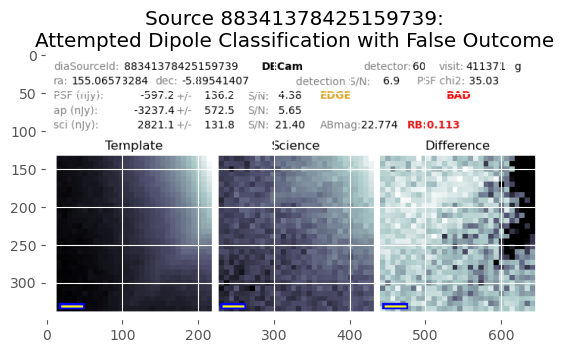

In [30]:
img = mpimg.imread('/Users/audrey/Documents/LSST/code/ap_verify-runs/DECam/d_2024_11_12-DM46681/repo/cutoutOutputs—Organized/cutoutOutputs-dm46681-extended/class—bogus/88341378425159739.png')
plt.imshow(img);
plt.title('Source 88341378425159739:\nAttempted Dipole Classification with False Outcome');

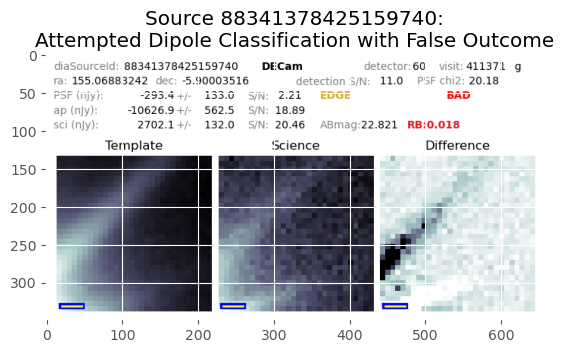

In [31]:
img = mpimg.imread('/Users/audrey/Documents/LSST/code/ap_verify-runs/DECam/d_2024_11_12-DM46681/repo/cutoutOutputs—Organized/cutoutOutputs-dm46681-extended/class—bogus/88341378425159740.png')
plt.imshow(img);
plt.title('Source 88341378425159740:\nAttempted Dipole Classification with False Outcome');

In [32]:
print(f'Number of Sources with Dipole Fit Classification True & Attempted Classification True = {len(dipoleClassAndAtt_TrueTrue)}')
print(f'Number of Sources with Dipole Fit Classification True & Attempted Classification False = {len(dipoleClassAndAtt_TrueFalse)}')
print(f'Number of Sources with Dipole Fit Classification False & Attempted Classification False = {len(dipoleClassAndAtt_FalseFalse)}')
print(f'Number of Sources with Dipole Fit Classification False & Attempted Classification True = {len(dipoleClassAndAtt_FalseTrue)}')

Number of Sources with Dipole Fit Classification True & Attempted Classification True = 415
Number of Sources with Dipole Fit Classification True & Attempted Classification False = 0
Number of Sources with Dipole Fit Classification False & Attempted Classification False = 470
Number of Sources with Dipole Fit Classification False & Attempted Classification True = 2


In [33]:
# Check to ensure all sources are accounted for while excluding sky sources
len(dipoleClassAndAtt_TrueTrue) + len(dipoleClassAndAtt_FalseFalse) + len(dipoleClassAndAtt_FalseTrue) == len(updatedSources[updatedSources['sky_source']==False])

True

#### b. Checking values of extendedness based on dipole classification

In [34]:
dipoleWithExtVal = dipoleClassAndAtt_TrueTrue[~dipoleClassAndAtt_TrueTrue['base_ClassificationSizeExtendedness_value'].isna()]

In [35]:
dipoleWithoutExtVal = dipoleClassAndAtt_TrueTrue[dipoleClassAndAtt_TrueTrue['base_ClassificationSizeExtendedness_value'].isnull()]

In [36]:
print(f'Number of dipoles with extendedness values = {len(dipoleClassAndAtt_TrueTrue)}')
print(f'Number of dipoles with extendedness values = {len(dipoleWithExtVal)}')
print(f'Number of dipoles without extendedness values = {len(dipoleWithoutExtVal)}')

# Check to make sure all sources are accounted for
len(dipoleClassAndAtt_TrueTrue) == len(dipoleWithExtVal) + len(dipoleWithoutExtVal)

Number of dipoles with extendedness values = 415
Number of dipoles with extendedness values = 161
Number of dipoles without extendedness values = 254


True

In [37]:
nonDipoleWithExtVal = dipoleClassAndAtt_FalseFalse[~dipoleClassAndAtt_FalseFalse['base_ClassificationSizeExtendedness_value'].isna()]

In [38]:
nonDipoleWithoutExtVal = dipoleClassAndAtt_FalseFalse[dipoleClassAndAtt_FalseFalse['base_ClassificationSizeExtendedness_value'].isnull()]

In [39]:
print(f'Number of non-dipoles with extendedness values = {len(dipoleClassAndAtt_FalseFalse)}')
print(f'Number of non-dipoles with extendedness values = {len(nonDipoleWithExtVal)}')
print(f'Number of non-dipoles without extendedness values = {len(nonDipoleWithoutExtVal)}')

# Check to make sure all sources are accounted for
len(dipoleClassAndAtt_FalseFalse) == len(nonDipoleWithExtVal) + len(nonDipoleWithoutExtVal)

Number of non-dipoles with extendedness values = 470
Number of non-dipoles with extendedness values = 108
Number of non-dipoles without extendedness values = 362


True

### 6. Splitting Catalog into Dipole vs Non-Dipoles + Extendedness Flag True vs. False for Image Cutout Creation

In [40]:
dipolesExtended = updated_run['rsrcTable'][(updated_run['rsrcTable']['isDipole']==True) & (~updated_run['rsrcTable']['extendedness'].isna())]

In [41]:
dipolesNotExtended = updated_run['rsrcTable'][(updated_run['rsrcTable']['isDipole']==True) & (updated_run['rsrcTable']['extendedness'].isna())]

In [42]:
extendedSources = updated_run['rsrcTable'][(updated_run['rsrcTable']['isDipole']==False) & (~updated_run['rsrcTable']['extendedness'].isna())]

In [43]:
notExtendedSources = updated_run['rsrcTable'][(updated_run['rsrcTable']['isDipole']==False) & (updated_run['rsrcTable']['extendedness'].isna())]

In [44]:
# Check that all sources are accounted for
len(updated_run['rsrcTable']) == len(dipolesExtended) + len(dipolesNotExtended) + len(extendedSources) + len(notExtendedSources)

True

### 7. Extendedness Value Distribution (Visual)

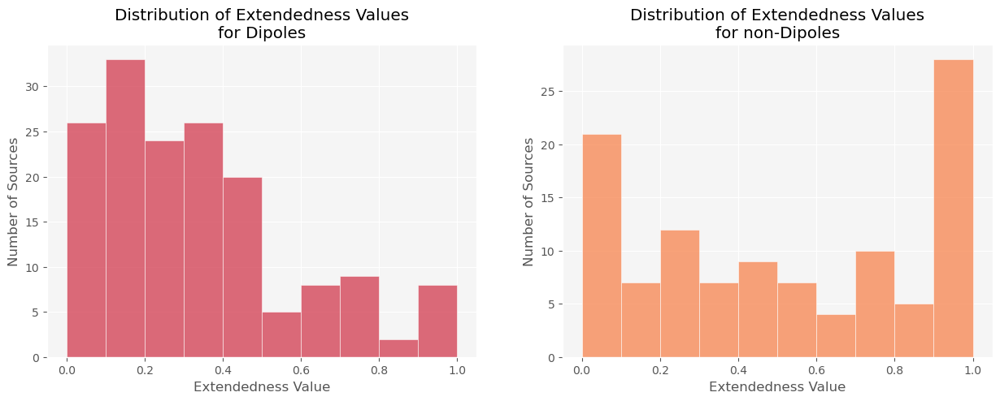

In [45]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
ax[0].hist(dipolesExtended['extendedness'], bins=10, alpha=0.75, color=sns.color_palette("Spectral", 20)[1], edgecolor='white')
ax[0].set_title('Distribution of Extendedness Values\nfor Dipoles');
ax[0].set_xlabel('Extendedness Value')
ax[0].set_ylabel('Number of Sources');

ax[1].hist(extendedSources['extendedness'], bins=10, alpha=0.75, color=sns.color_palette("Spectral", 20)[4], edgecolor='white')
ax[1].set_title('Distribution of Extendedness Values\nfor non-Dipoles');
ax[1].set_xlabel('Extendedness Value')
ax[1].set_ylabel('Number of Sources');

### 8. Generating Image Cutouts

In [46]:
def creatingImageCutouts(sources, imageType, butler, outputPath):
    iscConfig = plotISC.PlotImageSubtractionCutoutsConfig()
    iscConfig.science_image_type=imageType
    iscTask = plotISC.PlotImageSubtractionCutoutsTask(output_path=outputPath, config=iscConfig)
    iscRun = iscTask.run(sources, butler)

In [47]:
outputPath_dipolesExtended = '/Users/audrey/Documents/LSST/code/ap_verify-runs/DECam/d_2024_11_12-DM46681/repo/cutoutOutputs-dm46681-dipolesExtended'
outputPath_dipolesNotExtended = '/Users/audrey/Documents/LSST/code/ap_verify-runs/DECam/d_2024_11_12-DM46681/repo/cutoutOutputs-dm46681-dipolesNotExtended'
outputPath_extended = '/Users/audrey/Documents/LSST/code/ap_verify-runs/DECam/d_2024_11_12-DM46681/repo/cutoutOutputs-dm46681-extended'
outputPath_notExtended = '/Users/audrey/Documents/LSST/code/ap_verify-runs/DECam/d_2024_11_12-DM46681/repo/cutoutOutputs-dm46681-notExtended'


In [48]:
# Cutouts for dipoles with extendedness
# creatingImageCutouts(dipolesExtended, 'initial_pvi', butler_updated, outputPath_dipolesExtended)

In [49]:
# Cutouts for dipoles without extendedness
# creatingImageCutouts(dipolesNotExtended, 'initial_pvi', butler_updated, outputPath_dipolesNotExtended)

In [50]:
# Cutouts for non-dipole extended sources
# creatingImageCutouts(extendedSources, 'initial_pvi', butler_updated, outputPath_extended)

In [51]:
# Cutouts for non-dipole not extended sources
# creatingImageCutouts(notExtendedSources, 'initial_pvi', butler_updated, outputPath_notExtended)

### 9. Visualizing Manual Categorization of Image Cutouts

Using the output from the <code>d_2024_11_12—DM46681</code>, the image cutouts were manually categorized into the following categories:
1. Dipoles
2. Non-Dipoles

and then additionally split into four subcategories:
- Real
- Bogus
- Offset

In [52]:
def examineCutouts(dataframe, cutoutOutputDirectory, objType, catType):
    sourceId_list = [] 
    ra_list = []
    dec_list = []
    visit_list = []
    detector_list = []
    for filename in glob.iglob(f'{cutoutOutputDirectory}/*.png', recursive=True):
        sourceId = int(filename[-21:-4])
        ra = dataframe[dataframe['diaSourceId']==sourceId]['ra'].values[0]
        dec = dataframe[dataframe['diaSourceId']==sourceId]['dec'].values[0]
        visit = dataframe[dataframe['diaSourceId']==sourceId]['visit'].values[0]
        detector = dataframe[dataframe['diaSourceId']==sourceId]['detector'].values[0]

        sourceId_list.append(sourceId)
        ra_list.append(ra)
        dec_list.append(dec)
        visit_list.append(visit)
        detector_list.append(detector)
        
    data = {'sourceId': sourceId_list, 'ra': ra_list, 'dec': dec_list, 'visit': visit_list, 'detector': detector_list}    
    results = pd.DataFrame(data=data)
    if len(results)==0:
        print(f'No {objType} sources were classified as {catType}.')
    return results

In [53]:
# Dipoles with Extendedness Values
dipolesExtended_bogus = examineCutouts(dipolesExtended, '/Users/audrey/Documents/LSST/code/ap_verify-runs/DECam/d_2024_11_12-DM46681/repo/cutoutOutputs—Organized/cutoutOutputs-dm46681-dipolesExtended/class—bogus', 'extended dipole', 'bogus')
dipolesExtended_offset = examineCutouts(dipolesExtended, '/Users/audrey/Documents/LSST/code/ap_verify-runs/DECam/d_2024_11_12-DM46681/repo/cutoutOutputs—Organized/cutoutOutputs-dm46681-dipolesExtended/class—offset', 'extended dipole', 'offset')
dipolesExtended_real = examineCutouts(dipolesExtended, '/Users/audrey/Documents/LSST/code/ap_verify-runs/DECam/d_2024_11_12-DM46681/repo/cutoutOutputs—Organized/cutoutOutputs-dm46681-dipolesExtended/class—real', 'extended dipole', 'real')


No extended dipole sources were classified as bogus.


In [54]:
# Dipoles without Extendedness Values
dipolesNotExtended_bogus = examineCutouts(dipolesNotExtended, '/Users/audrey/Documents/LSST/code/ap_verify-runs/DECam/d_2024_11_12-DM46681/repo/cutoutOutputs—Organized/cutoutOutputs-dm46681-dipolesNotExtended/class—bogus', 'non-extended dipole', 'bogus')
dipolesNotExtended_offset = examineCutouts(dipolesNotExtended, '/Users/audrey/Documents/LSST/code/ap_verify-runs/DECam/d_2024_11_12-DM46681/repo/cutoutOutputs—Organized/cutoutOutputs-dm46681-dipolesNotExtended/class—offset', 'non-extended dipole', 'offset')
dipolesNotExtended_real = examineCutouts(dipolesNotExtended, '/Users/audrey/Documents/LSST/code/ap_verify-runs/DECam/d_2024_11_12-DM46681/repo/cutoutOutputs—Organized/cutoutOutputs-dm46681-dipolesNotExtended/class—real', 'non-extended dipole', 'real')


In [55]:
# Non-Dipoles with Extendedness Values
extendedSources_bogus = examineCutouts(extendedSources, '/Users/audrey/Documents/LSST/code/ap_verify-runs/DECam/d_2024_11_12-DM46681/repo/cutoutOutputs—Organized/cutoutOutputs-dm46681-extended/class—bogus', 'extended', 'bogus')
extendedSources_offset = examineCutouts(extendedSources, '/Users/audrey/Documents/LSST/code/ap_verify-runs/DECam/d_2024_11_12-DM46681/repo/cutoutOutputs—Organized/cutoutOutputs-dm46681-extended/class—offset', 'extended', 'offset')
extendedSources_real = examineCutouts(extendedSources, '/Users/audrey/Documents/LSST/code/ap_verify-runs/DECam/d_2024_11_12-DM46681/repo/cutoutOutputs—Organized/cutoutOutputs-dm46681-extended/class—real', 'extended', 'real')


In [56]:
# Non-Dipoles without Extendedness Values
notExtendedSources_bogus = examineCutouts(notExtendedSources, '/Users/audrey/Documents/LSST/code/ap_verify-runs/DECam/d_2024_11_12-DM46681/repo/cutoutOutputs—Organized/cutoutOutputs-dm46681-notExtended/class—bogus', 'non-extended', 'bogus')
notExtendedSources_offset = examineCutouts(notExtendedSources, '/Users/audrey/Documents/LSST/code/ap_verify-runs/DECam/d_2024_11_12-DM46681/repo/cutoutOutputs—Organized/cutoutOutputs-dm46681-notExtended/class—offset', 'non-extended', 'offset')
notExtendedSources_real = examineCutouts(notExtendedSources, '/Users/audrey/Documents/LSST/code/ap_verify-runs/DECam/d_2024_11_12-DM46681/repo/cutoutOutputs—Organized/cutoutOutputs-dm46681-notExtended/class—real', 'non-extended', 'real')


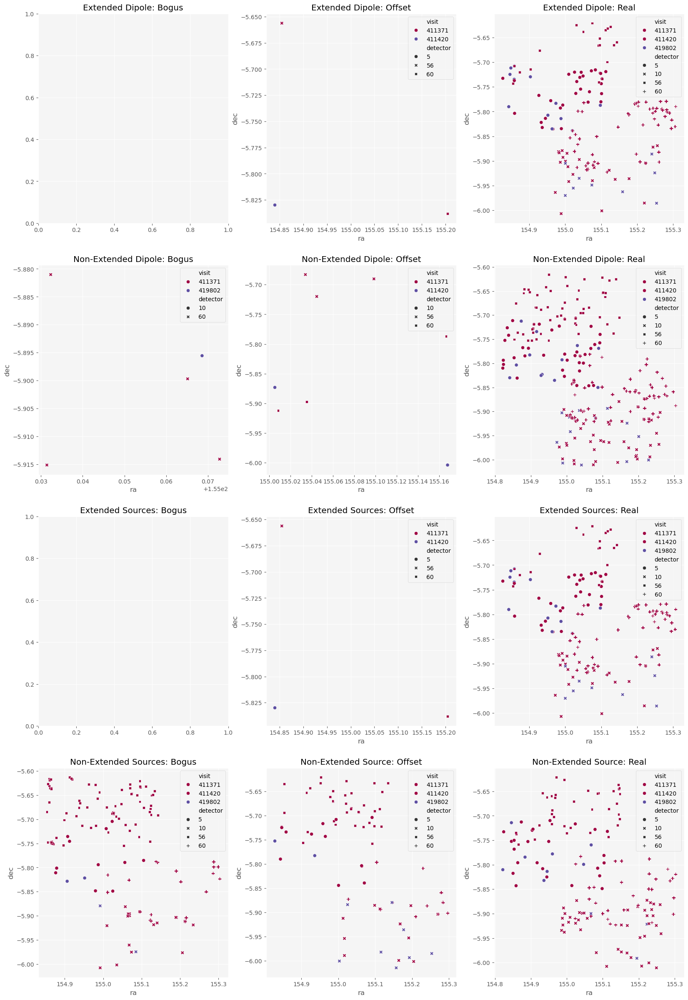

In [57]:
f, axes = plt.subplots(4, 3, figsize=(20,30))

# Dipoles with extendedness values
sns.scatterplot(data=dipolesExtended_bogus, x='ra', y='dec', hue='visit', style='detector', palette=sns.color_palette("Spectral", as_cmap=True), ax=axes[0, 0]).set(title=f'Extended Dipole: Bogus');
sns.scatterplot(data=dipolesExtended_offset, x='ra', y='dec', hue='visit', style='detector', palette=sns.color_palette("Spectral", as_cmap=True), ax=axes[0, 1]).set(title=f'Extended Dipole: Offset');
sns.scatterplot(data=dipolesExtended_real, x='ra', y='dec', hue='visit', style='detector', palette=sns.color_palette("Spectral", as_cmap=True), ax=axes[0, 2]).set(title=f'Extended Dipole: Real');

# Dipoles without extendedness values
sns.scatterplot(data=dipolesNotExtended_bogus, x='ra', y='dec', hue='visit', style='detector', palette=sns.color_palette("Spectral", as_cmap=True), ax=axes[1, 0]).set(title=f'Non-Extended Dipole: Bogus');
sns.scatterplot(data=dipolesNotExtended_offset, x='ra', y='dec', hue='visit', style='detector', palette=sns.color_palette("Spectral", as_cmap=True), ax=axes[1, 1]).set(title=f'Non-Extended Dipole: Offset');
sns.scatterplot(data=dipolesNotExtended_real, x='ra', y='dec', hue='visit', style='detector', palette=sns.color_palette("Spectral", as_cmap=True), ax=axes[1, 2]).set(title=f'Non-Extended Dipole: Real');

# Non-dipole extended sources
sns.scatterplot(data=dipolesExtended_bogus, x='ra', y='dec', hue='visit', style='detector', palette=sns.color_palette("Spectral", as_cmap=True), ax=axes[2, 0]).set(title=f'Extended Sources: Bogus');
sns.scatterplot(data=dipolesExtended_offset, x='ra', y='dec', hue='visit', style='detector', palette=sns.color_palette("Spectral", as_cmap=True), ax=axes[2, 1]).set(title=f'Extended Sources: Offset');
sns.scatterplot(data=dipolesExtended_real, x='ra', y='dec', hue='visit', style='detector', palette=sns.color_palette("Spectral", as_cmap=True), ax=axes[2, 2]).set(title=f'Extended Sources: Real');

# Non-dipole, non-extended sources
sns.scatterplot(data=notExtendedSources_bogus, x='ra', y='dec', hue='visit', style='detector', palette=sns.color_palette("Spectral", as_cmap=True), ax=axes[3, 0]).set(title=f'Non-Extended Sources: Bogus');
sns.scatterplot(data=notExtendedSources_offset, x='ra', y='dec', hue='visit', style='detector', palette=sns.color_palette("Spectral", as_cmap=True), ax=axes[3, 1]).set(title=f'Non-Extended Source: Offset');
sns.scatterplot(data=notExtendedSources_real, x='ra', y='dec', hue='visit', style='detector', palette=sns.color_palette("Spectral", as_cmap=True), ax=axes[3, 2]).set(title=f'Non-Extended Source: Real');


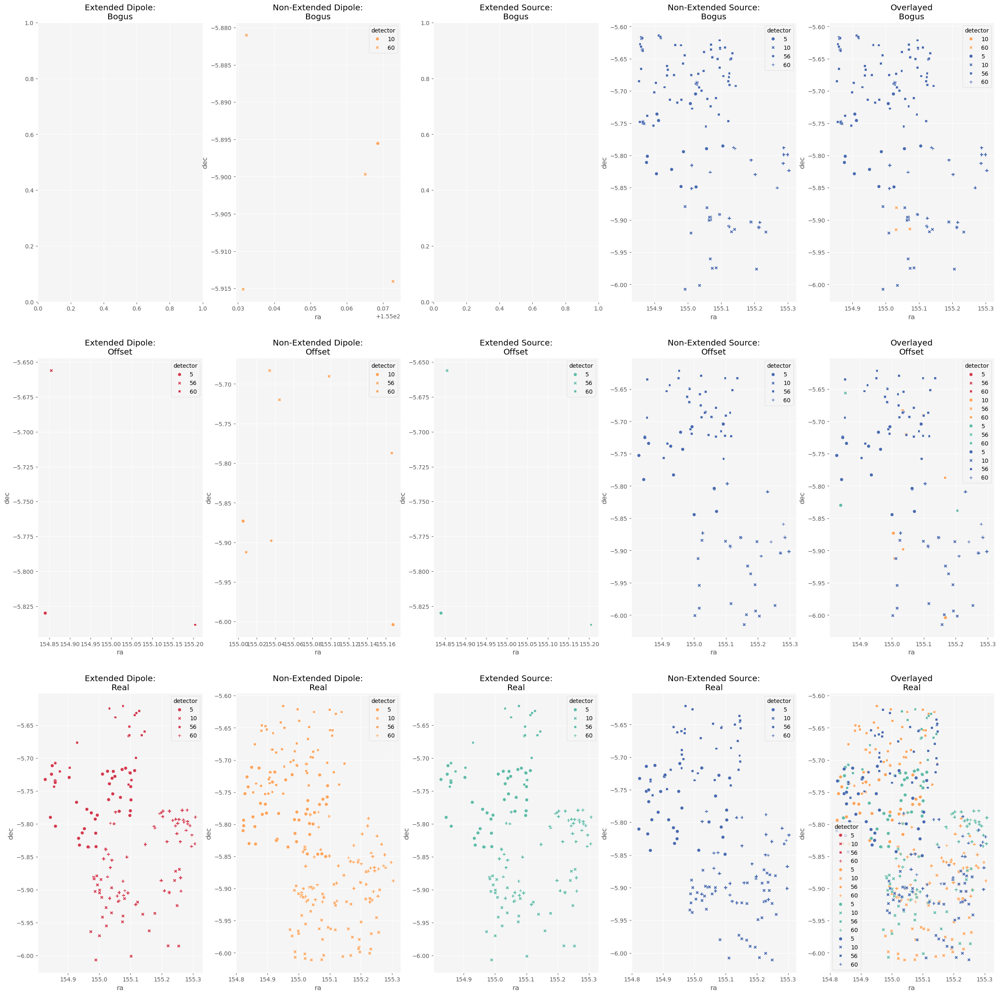

In [58]:
f, axes = plt.subplots(3, 5, figsize=(30,30))

# Bogus sources
sns.scatterplot(data=dipolesExtended_bogus, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[1], ax=axes[0, 0]).set(title=f'Extended Dipole:\nBogus');
sns.scatterplot(data=dipolesNotExtended_bogus, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[5], ax=axes[0, 1]).set(title=f'Non-Extended Dipole:\nBogus');
sns.scatterplot(data=dipolesExtended_bogus, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[16], ax=axes[0, 2]).set(title=f'Extended Source:\nBogus');
sns.scatterplot(data=notExtendedSources_bogus, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[19], ax=axes[0, 3]).set(title=f'Non-Extended Source:\nBogus');

sns.scatterplot(data=dipolesExtended_bogus, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[1], ax=axes[0, 4]).set(title=f'Overlayed\nBogus');
sns.scatterplot(data=dipolesNotExtended_bogus, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[5], ax=axes[0, 4]);
sns.scatterplot(data=dipolesExtended_bogus, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[16], ax=axes[0, 4]);
sns.scatterplot(data=notExtendedSources_bogus, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[19], ax=axes[0, 4]);

# Offset sources
sns.scatterplot(data=dipolesExtended_offset, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[1], ax=axes[1, 0]).set(title=f'Extended Dipole:\nOffset');
sns.scatterplot(data=dipolesNotExtended_offset, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[5], ax=axes[1, 1]).set(title=f'Non-Extended Dipole:\nOffset');
sns.scatterplot(data=dipolesExtended_offset, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[16], ax=axes[1, 2]).set(title=f'Extended Source:\nOffset');
sns.scatterplot(data=notExtendedSources_offset, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[19], ax=axes[1, 3]).set(title=f'Non-Extended Source:\nOffset');

sns.scatterplot(data=dipolesExtended_offset, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[1], ax=axes[1, 4]).set(title=f'Overlayed\nOffset');
sns.scatterplot(data=dipolesNotExtended_offset, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[5], ax=axes[1, 4]);
sns.scatterplot(data=dipolesExtended_offset, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[16], ax=axes[1, 4]);
sns.scatterplot(data=notExtendedSources_offset, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[19], ax=axes[1, 4]);

# Real sources
sns.scatterplot(data=dipolesExtended_real, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[1], ax=axes[2, 0]).set(title=f'Extended Dipole:\nReal');
sns.scatterplot(data=dipolesNotExtended_real, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[5], ax=axes[2, 1]).set(title=f'Non-Extended Dipole:\nReal');
sns.scatterplot(data=dipolesExtended_real, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[16], ax=axes[2, 2]).set(title=f'Extended Source:\nReal');
sns.scatterplot(data=notExtendedSources_real, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[19], ax=axes[2, 3]).set(title=f'Non-Extended Source:\nReal');

sns.scatterplot(data=dipolesExtended_real, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[1], ax=axes[2, 4]).set(title=f'Overlayed\nReal');
sns.scatterplot(data=dipolesNotExtended_real, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[5], ax=axes[2, 4]);
sns.scatterplot(data=dipolesExtended_real, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[16], ax=axes[2, 4]);
sns.scatterplot(data=notExtendedSources_real, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[19], ax=axes[2, 4]);

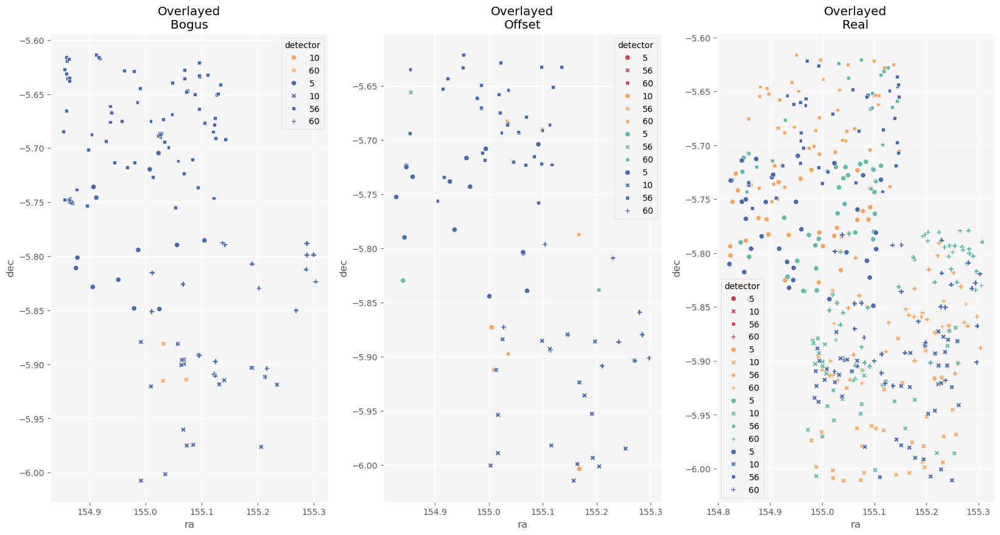

In [59]:
# Just overlayed sources

f, axes = plt.subplots(1, 3, figsize=(20, 10))

# Bogus sources
sns.scatterplot(data=dipolesExtended_bogus, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[1], ax=axes[0]).set(title=f'Overlayed\nBogus');
sns.scatterplot(data=dipolesNotExtended_bogus, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[5], ax=axes[0]);
sns.scatterplot(data=dipolesExtended_bogus, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[16], ax=axes[0]);
sns.scatterplot(data=notExtendedSources_bogus, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[19], ax=axes[0]);

# Offset sources
sns.scatterplot(data=dipolesExtended_offset, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[1], ax=axes[1]).set(title=f'Overlayed\nOffset');
sns.scatterplot(data=dipolesNotExtended_offset, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[5], ax=axes[1]);
sns.scatterplot(data=dipolesExtended_offset, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[16], ax=axes[1]);
sns.scatterplot(data=notExtendedSources_offset, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[19], ax=axes[1]);

# Real sources
sns.scatterplot(data=dipolesExtended_real, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[1], ax=axes[2]).set(title=f'Overlayed\nReal');
sns.scatterplot(data=dipolesNotExtended_real, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[5], ax=axes[2]);
sns.scatterplot(data=dipolesExtended_real, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[16], ax=axes[2]);
sns.scatterplot(data=notExtendedSources_real, x='ra', y='dec', style='detector', color=sns.color_palette("Spectral", 20)[19], ax=axes[2]);


### 10. Source Location Split by Type & Extendedness Flag

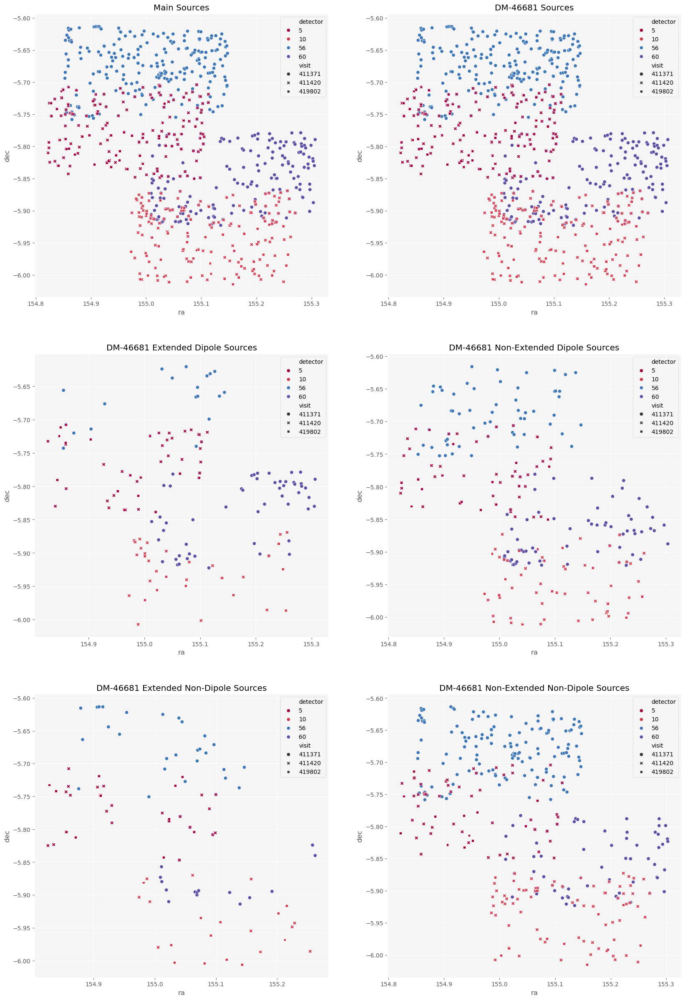

In [60]:
f, axes = plt.subplots(3, 2, figsize=(20,30))
sns.scatterplot(data=main_run['rsrcTable'], x='ra', y='dec', hue='detector', style='visit', palette=sns.color_palette("Spectral", as_cmap=True), alpha=1.0, ax=axes[0, 0]).set(title=f'Main Sources');
sns.scatterplot(data=updated_run['rsrcTable'], x='ra', y='dec', hue='detector', style='visit', palette=sns.color_palette("Spectral", as_cmap=True), alpha=1.0, ax=axes[0, 1]).set(title=f'DM-46681 Sources');

sns.scatterplot(data=dipolesExtended, x='ra', y='dec', hue='detector', style='visit', palette=sns.color_palette("Spectral", as_cmap=True), alpha=1.0, ax=axes[1, 0]).set(title=f'DM-46681 Extended Dipole Sources');
sns.scatterplot(data=dipolesNotExtended, x='ra', y='dec', hue='detector', style='visit', palette=sns.color_palette("Spectral", as_cmap=True), alpha=1.0, ax=axes[1, 1]).set(title=f'DM-46681 Non-Extended Dipole Sources');

sns.scatterplot(data=extendedSources, x='ra', y='dec', hue='detector', style='visit', palette=sns.color_palette("Spectral", as_cmap=True), alpha=1.0, ax=axes[2, 0]).set(title=f'DM-46681 Extended Non-Dipole Sources');
sns.scatterplot(data=notExtendedSources, x='ra', y='dec', hue='detector', style='visit', palette=sns.color_palette("Spectral", as_cmap=True), alpha=1.0, ax=axes[2, 1]).set(title=f'DM-46681 Non-Extended Non-Dipole Sources');

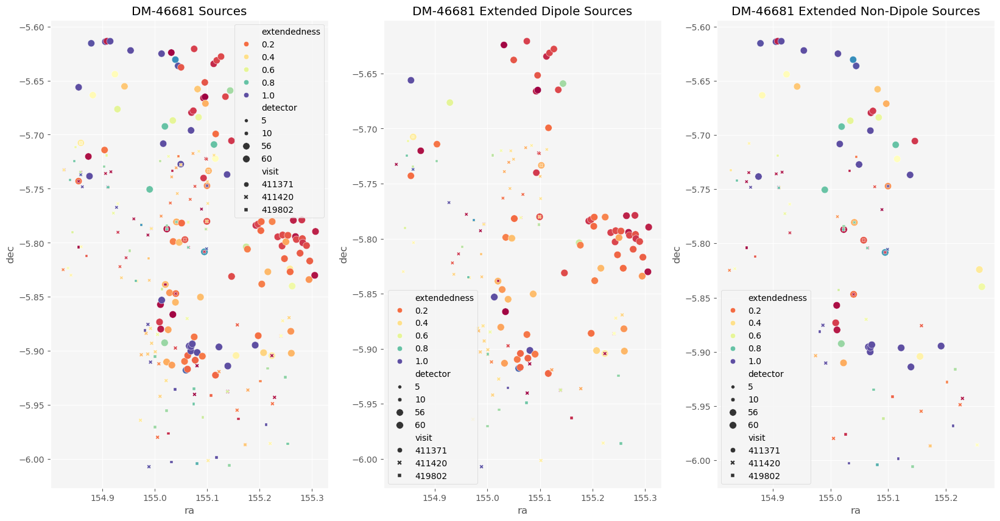

In [61]:
f, axes = plt.subplots(1, 3, figsize=(20,10))
sns.scatterplot(data=updated_run['rsrcTable'], x='ra', y='dec', hue='extendedness', style='visit', size='detector', palette=sns.color_palette("Spectral", as_cmap=True), alpha=1.0, ax=axes[0]).set(title=f'DM-46681 Sources');
sns.scatterplot(data=dipolesExtended, x='ra', y='dec', hue='extendedness', style='visit', size='detector', palette=sns.color_palette("Spectral", as_cmap=True), alpha=1.0, ax=axes[1]).set(title=f'DM-46681 Extended Dipole Sources');
sns.scatterplot(data=extendedSources, x='ra', y='dec', hue='extendedness', style='visit', size='detector', palette=sns.color_palette("Spectral", as_cmap=True), alpha=1.0, ax=axes[2]).set(title=f'DM-46681 Extended Non-Dipole Sources');

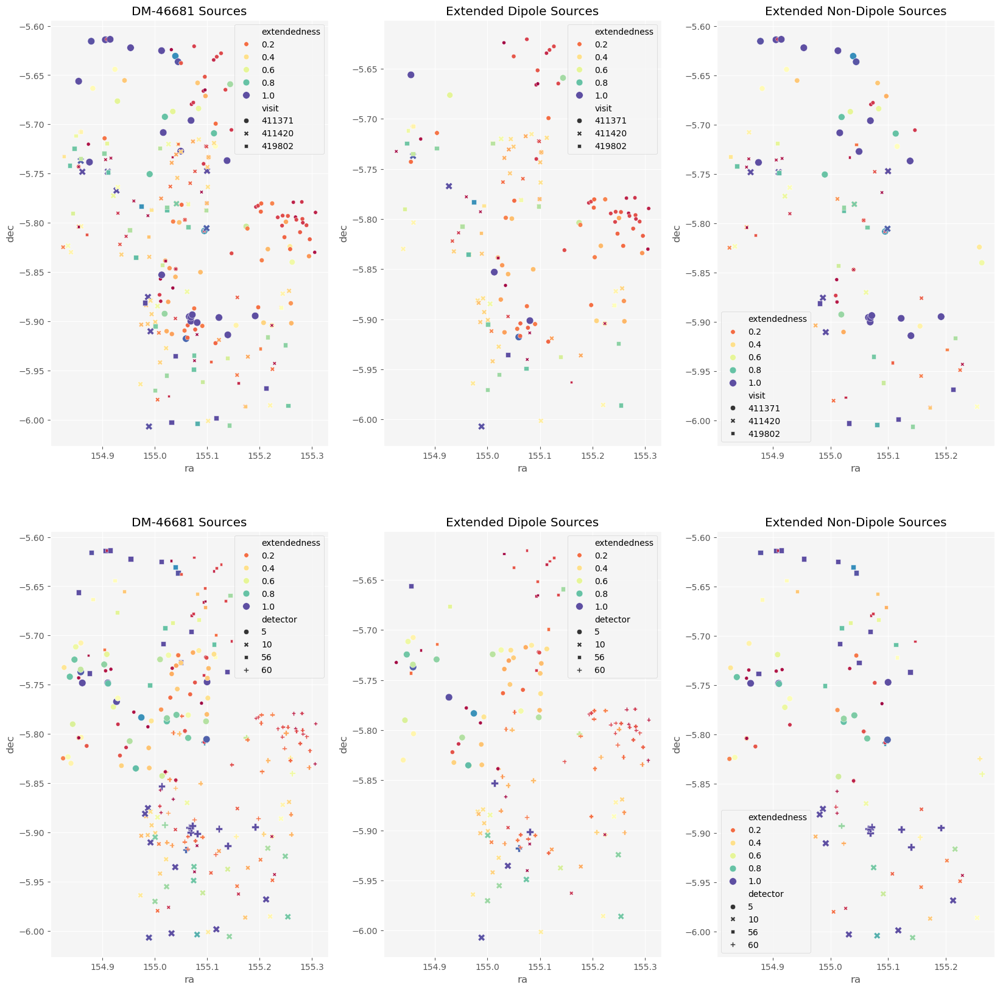

In [62]:
f, axes = plt.subplots(2, 3, figsize=(20,20))
sns.scatterplot(data=updated_run['rsrcTable'], x='ra', y='dec', hue='extendedness', style='visit', size='extendedness', palette=sns.color_palette("Spectral", as_cmap=True), alpha=1.0, ax=axes[0, 0]).set(title=f'DM-46681 Sources');
sns.scatterplot(data=dipolesExtended, x='ra', y='dec', hue='extendedness', style='visit', size='extendedness', palette=sns.color_palette("Spectral", as_cmap=True), alpha=1.0, ax=axes[0, 1]).set(title=f'Extended Dipole Sources');
sns.scatterplot(data=extendedSources, x='ra', y='dec', hue='extendedness', style='visit', size='extendedness', palette=sns.color_palette("Spectral", as_cmap=True), alpha=1.0, ax=axes[0, 2]).set(title=f'Extended Non-Dipole Sources');

sns.scatterplot(data=updated_run['rsrcTable'], x='ra', y='dec', hue='extendedness', style='detector', size='extendedness', palette=sns.color_palette("Spectral", as_cmap=True), alpha=1.0, ax=axes[1, 0]).set(title=f'DM-46681 Sources');
sns.scatterplot(data=dipolesExtended, x='ra', y='dec', hue='extendedness', style='detector', size='extendedness', palette=sns.color_palette("Spectral", as_cmap=True), alpha=1.0, ax=axes[1, 1]).set(title=f'Extended Dipole Sources');
sns.scatterplot(data=extendedSources, x='ra', y='dec', hue='extendedness', style='detector', size='extendedness', palette=sns.color_palette("Spectral", as_cmap=True), alpha=1.0, ax=axes[1, 2]).set(title=f'Extended Non-Dipole Sources');


### 11. Visualizing Flags

In [63]:
sns.color_palette("Spectral", 8)

[(0.8472126105344099, 0.2612072279892349, 0.30519031141868513),
 (0.9637831603229527, 0.47743175701653207, 0.28581314878892733),
 (0.9934640522875817, 0.7477124183006535, 0.4352941176470587),
 (0.9977700884275279, 0.930872741253364, 0.6330642060745867),
 (0.944252210688197, 0.9777008842752788, 0.6620530565167244),
 (0.7477124183006538, 0.8980392156862746, 0.6274509803921569),
 (0.4530565167243369, 0.7815455594002307, 0.6462898885044214),
 (0.21607074202229912, 0.5556324490580546, 0.7319492502883507)]

In [64]:
flagList = ['base_PixelFlags_flag_bad', 'base_PixelFlags_flag_crCenter', 'base_PixelFlags_flag_interpolatedCenter', 
            'base_PixelFlags_flag_interpolatedCenterAll', 'base_PixelFlags_flag_saturatedCenter', 'base_PixelFlags_flag_saturatedCenterAll',
            'base_PixelFlags_flag_suspectCenter', 'base_PixelFlags_flag_streakCenter', 'base_PixelFlags_flag_injectedCenter', 
            'base_PixelFlags_flag_injected_templateCenter']

In [65]:
def visualFlagComparison(mainRunSources, updatedRunSources, mainName, updatedName, status, listOfFlags):
    for flag in listOfFlags:
        main = mainRunSources[mainRunSources[flag]==status]
        updated = updatedRunSources[updatedRunSources[flag]==status]

        sameSources = []
        for m, u in zip(main['id'], updated['id']):
            if m==u:
                sameSources.append(u)
        
        if len(main)>1 or len(updated)>1:
            f, axes = plt.subplots(1, 3, figsize=(20,10))
            sns.scatterplot(data=main, x='coord_ra', y='coord_dec', marker='X', color=sns.color_palette("Spectral", 8)[0], alpha=0.75, ax=axes[0]).set(title=f'{mainName}: \n{flag} = {status}')
            sns.scatterplot(data=updated, x='coord_ra', y='coord_dec', color=sns.color_palette("Spectral", 8)[7], alpha=0.75, ax=axes[1]).set(title=f'{updatedName}: \n{flag} = {status}')
            sns.scatterplot(data=main, x='coord_ra', y='coord_dec', marker='X', color=sns.color_palette("Spectral", 8)[0], alpha=1.0, ax=axes[2]).set(title=f'{mainName} & {updatedName}: \n{flag} = {status}')
            sns.scatterplot(data=updated, x='coord_ra', y='coord_dec', color=sns.color_palette("Spectral", 8)[7], alpha=0.5, ax=axes[2])

#### Comparison With Main

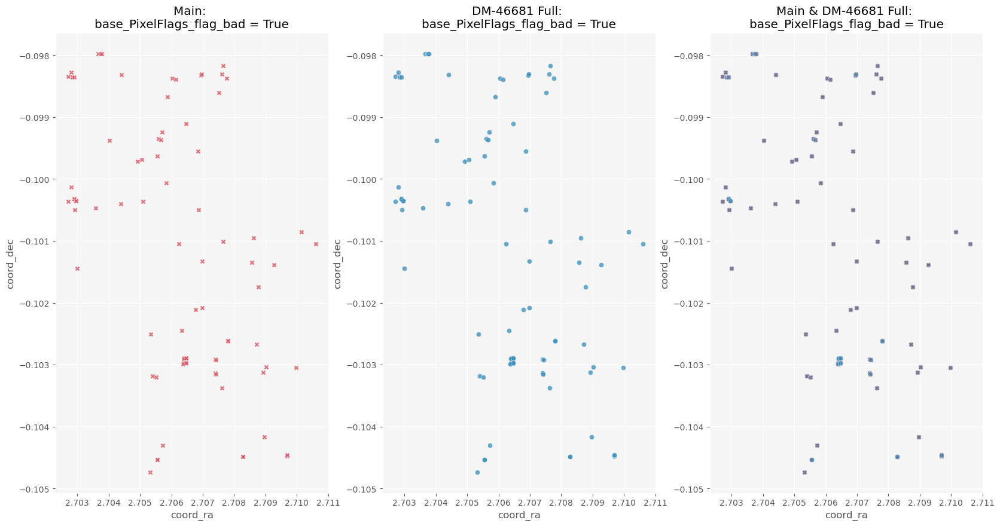

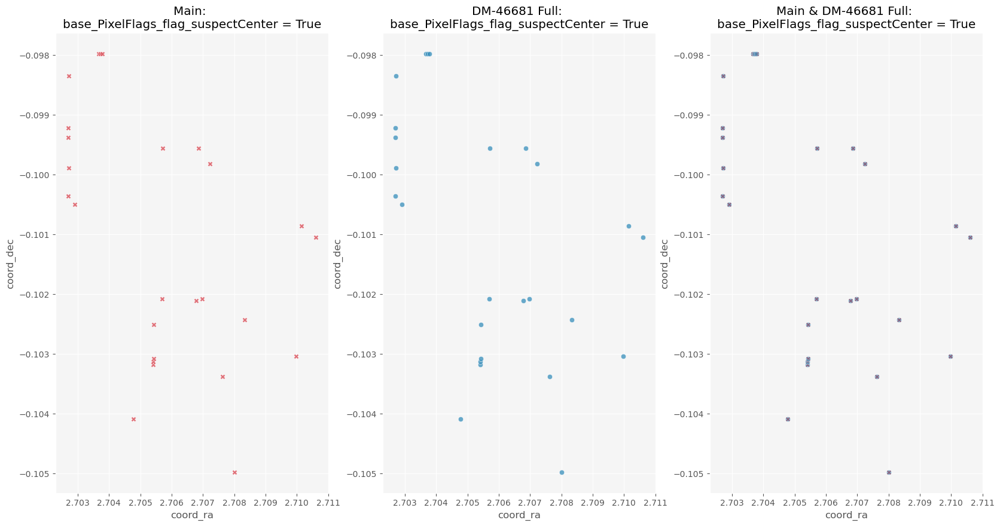

In [66]:
visualFlagComparison(mainSources, updatedSources, 'Main', 'DM-46681 Full',  True, flagList)

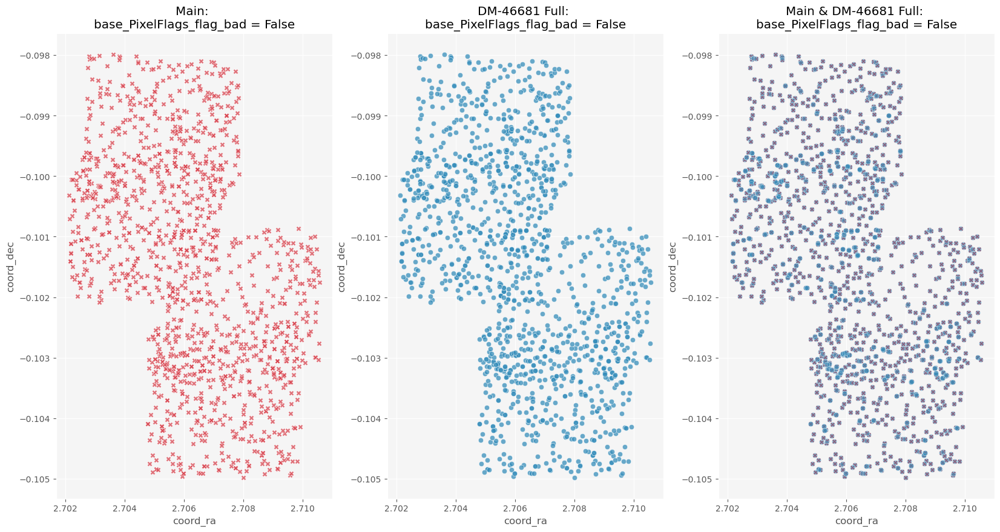

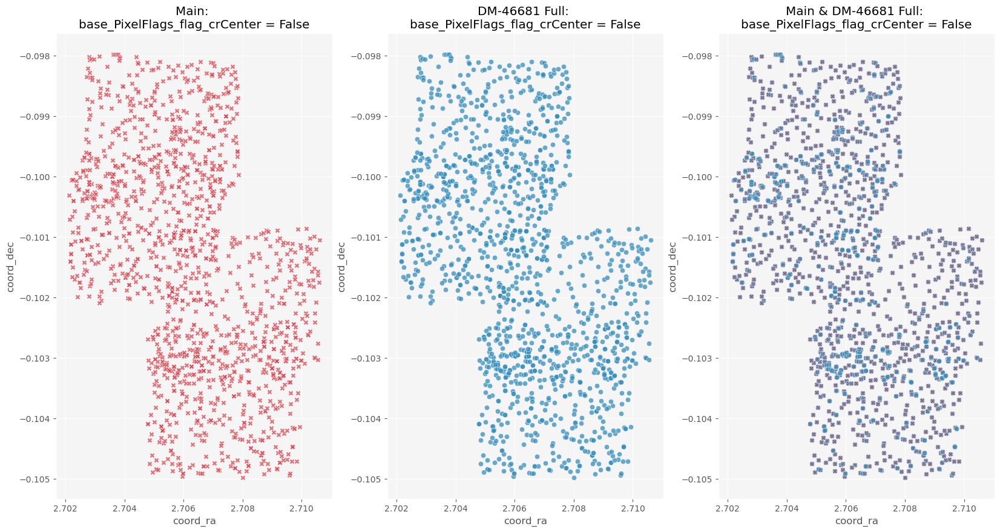

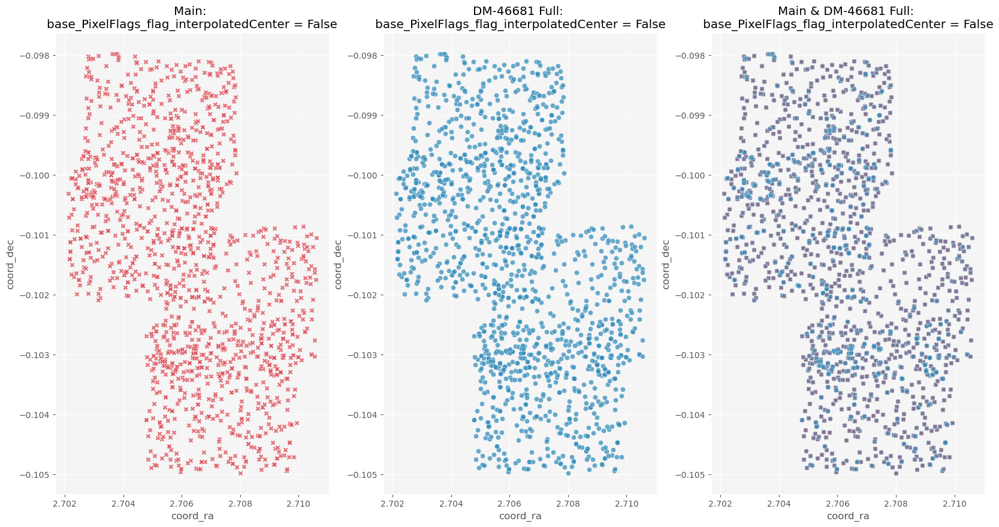

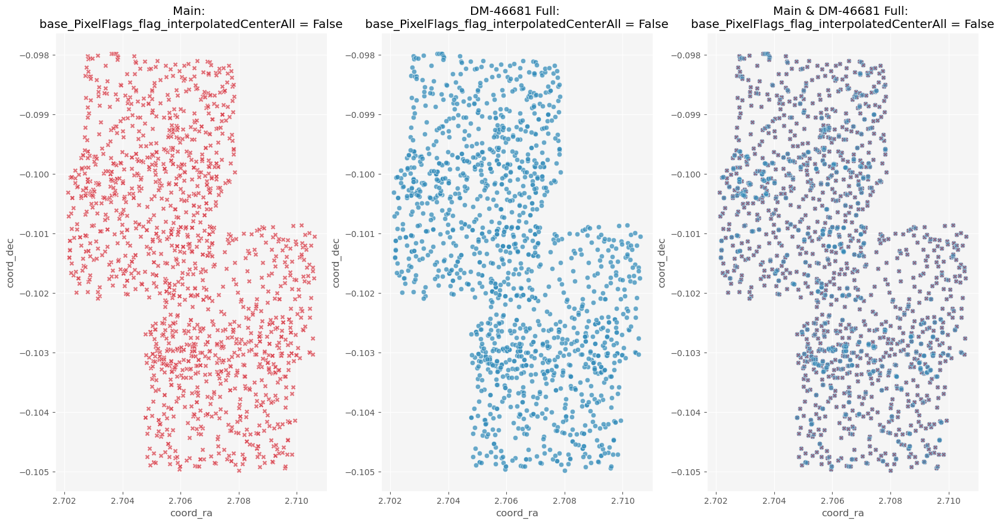

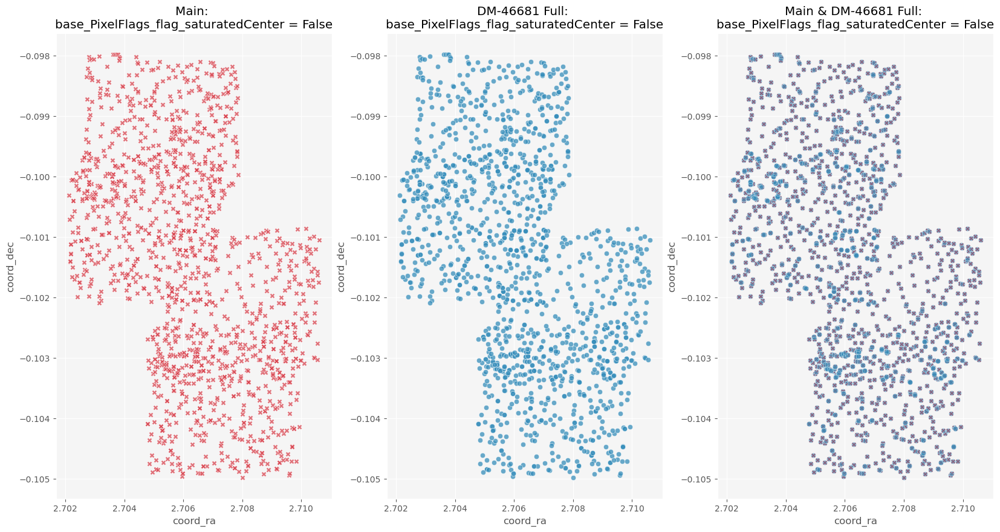

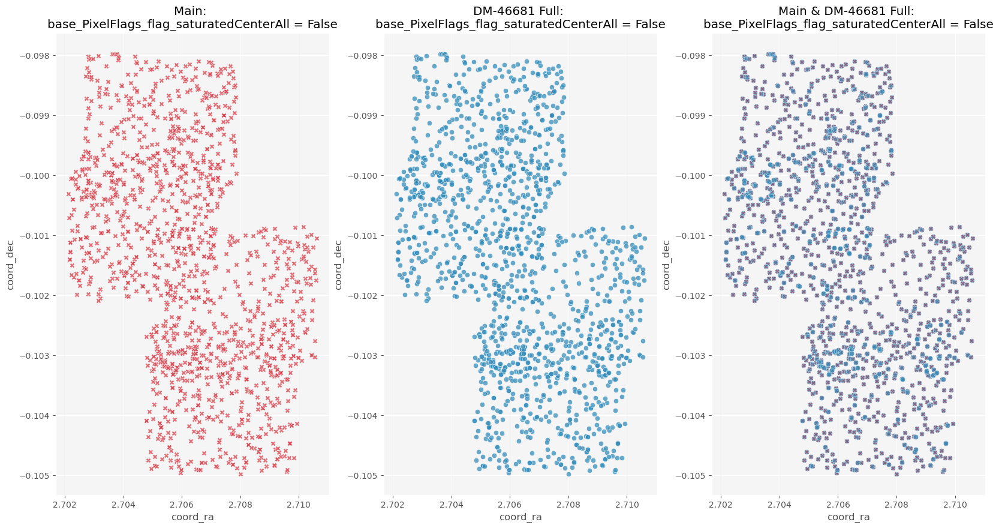

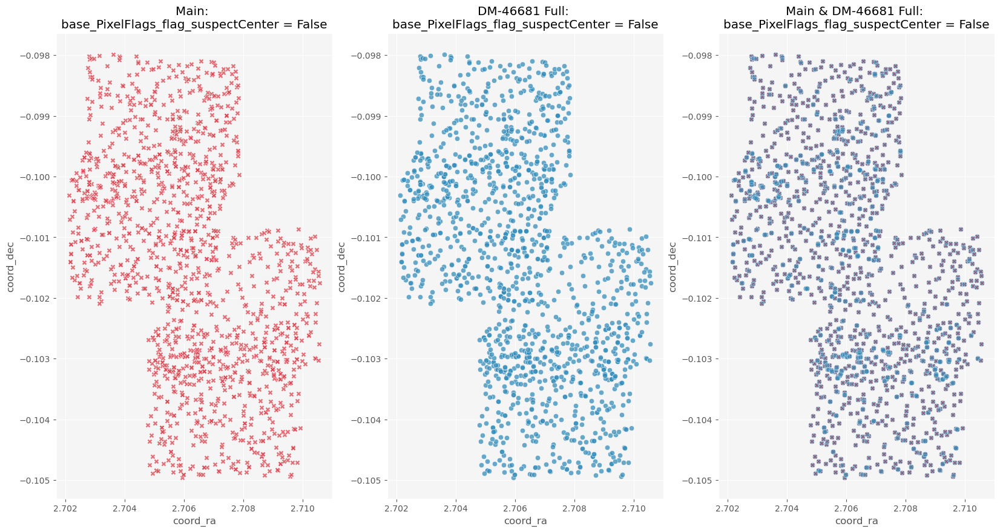

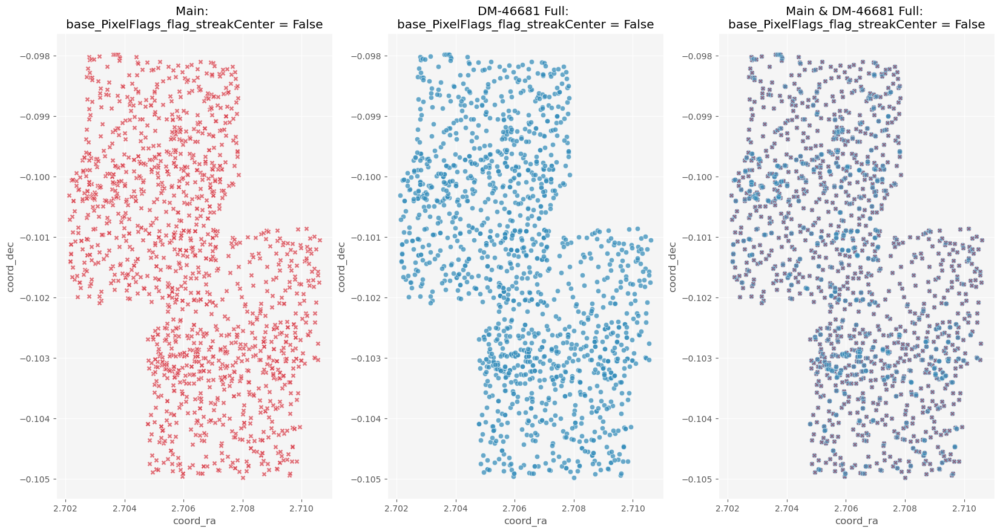

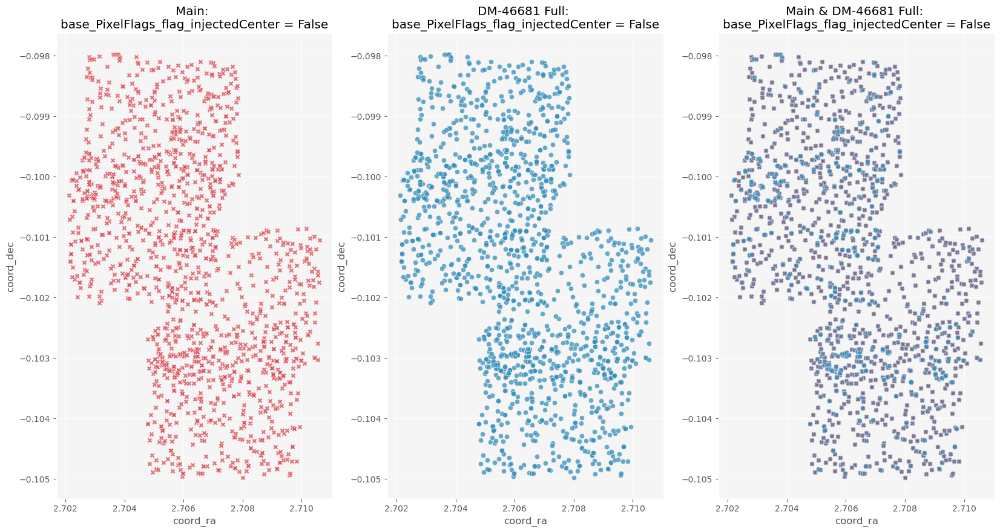

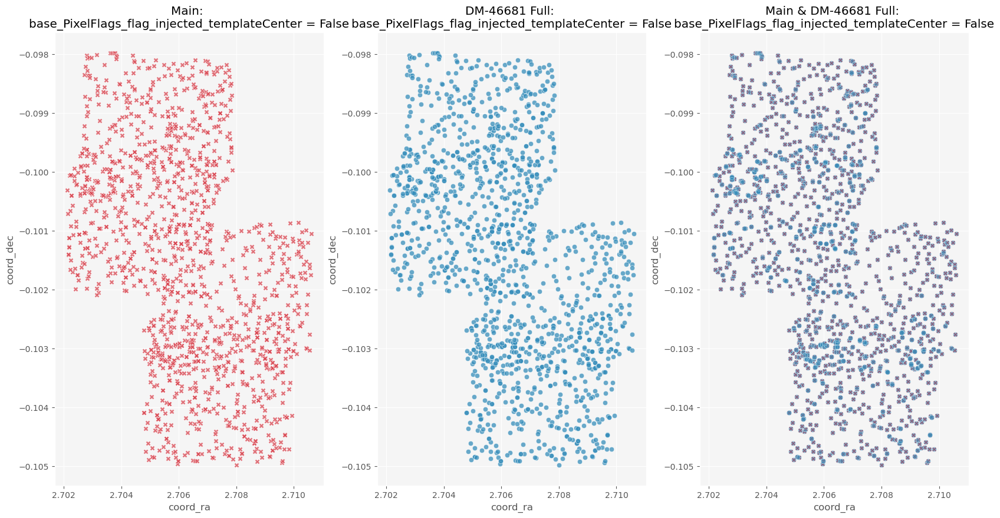

In [67]:
visualFlagComparison(mainSources, updatedSources, 'Main', 'DM-46681 Full', False, flagList)

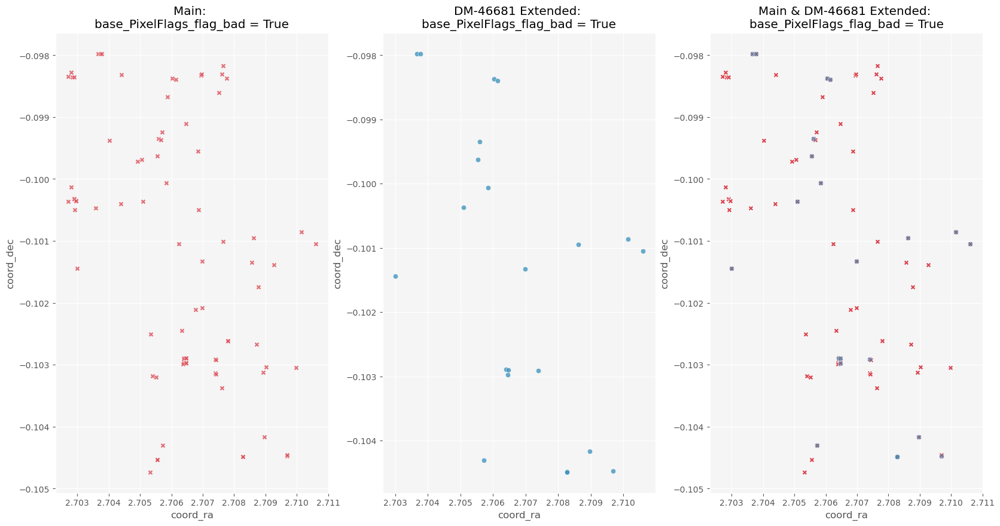

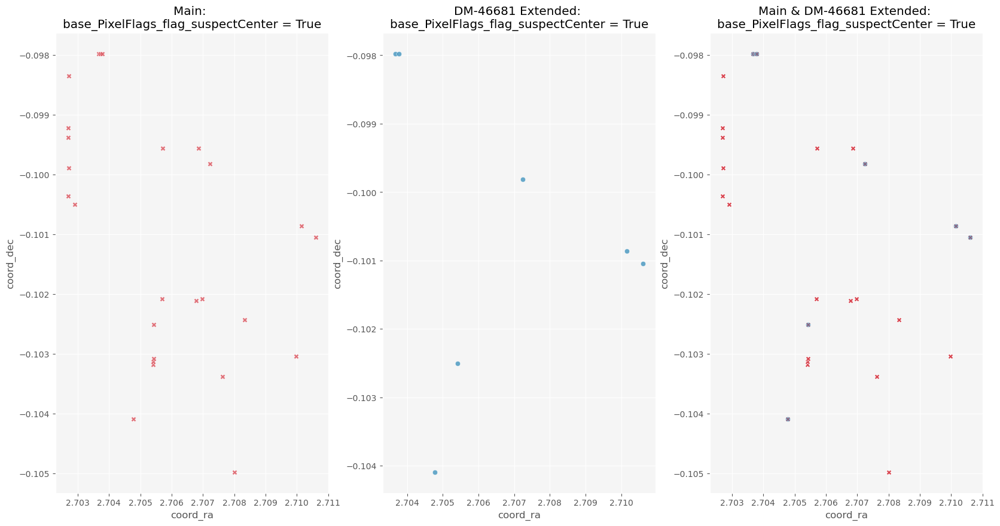

In [68]:
visualFlagComparison(mainSources, updatedSourcesExtFalse, 'Main', 'DM-46681 Extended', True, flagList)

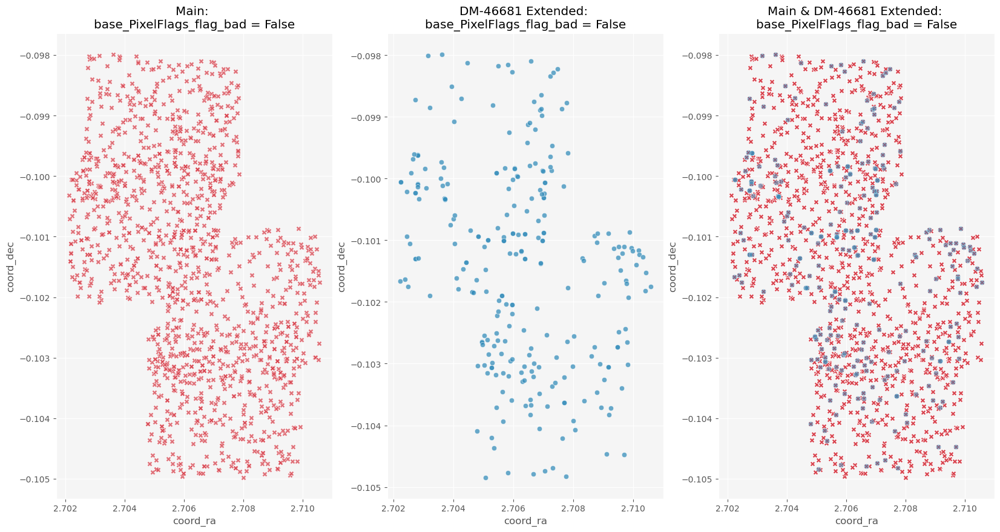

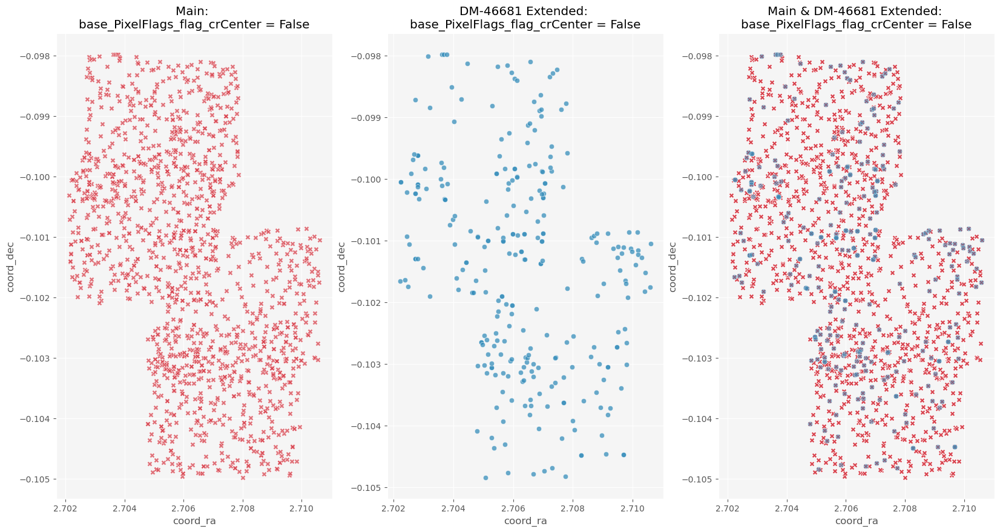

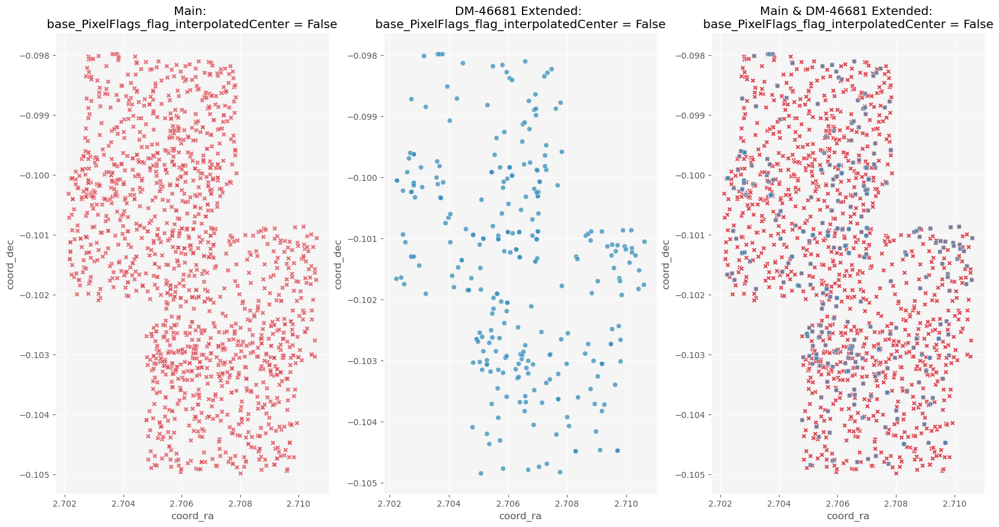

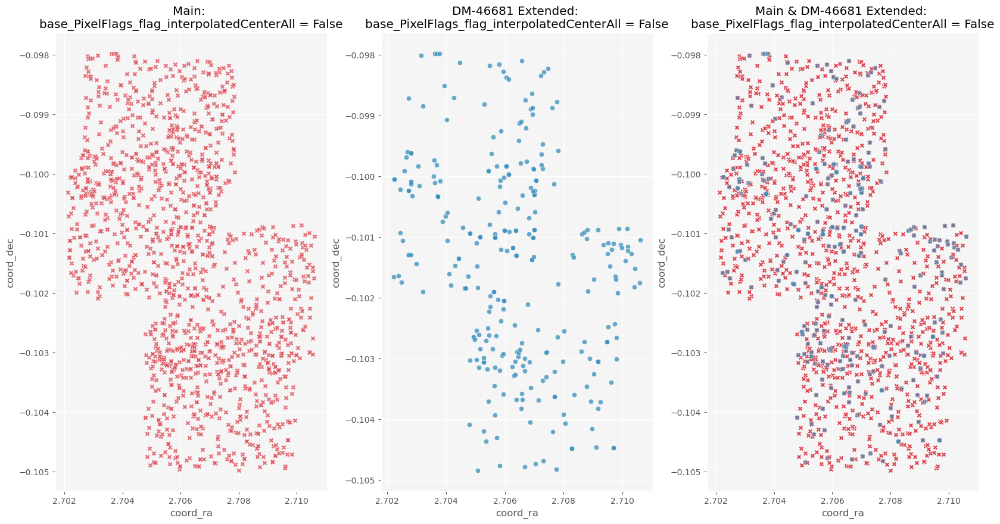

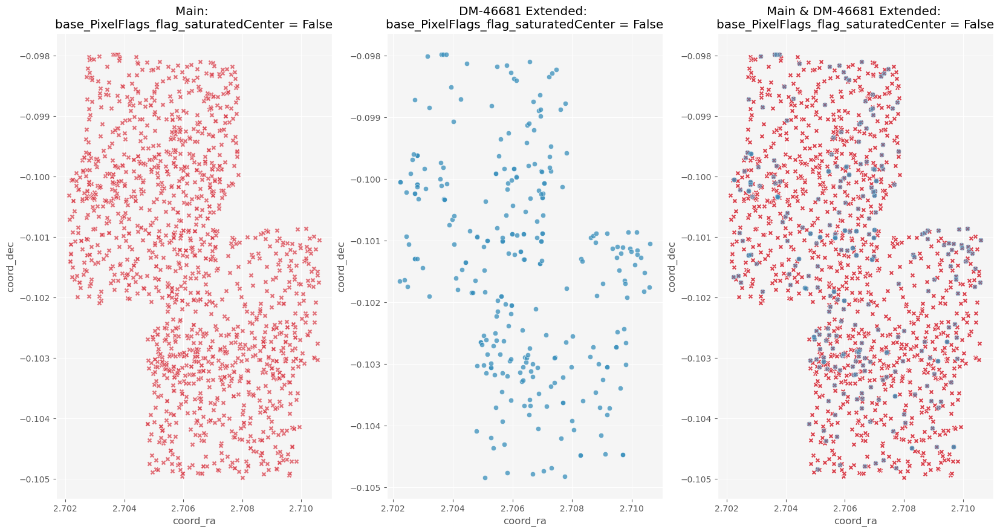

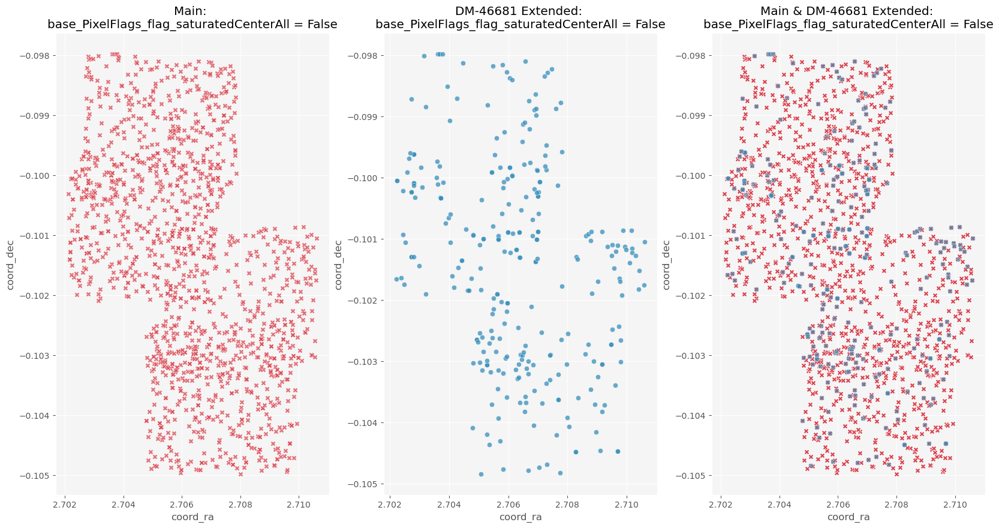

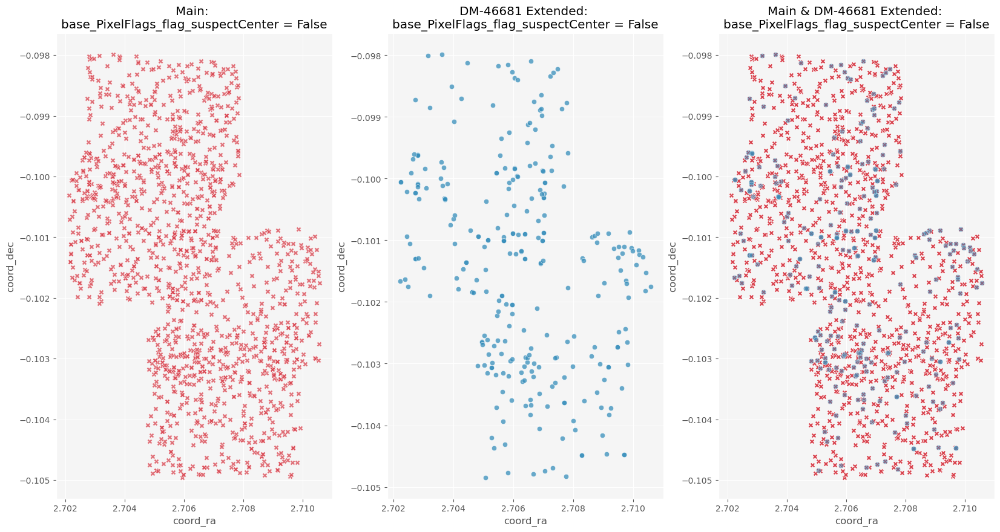

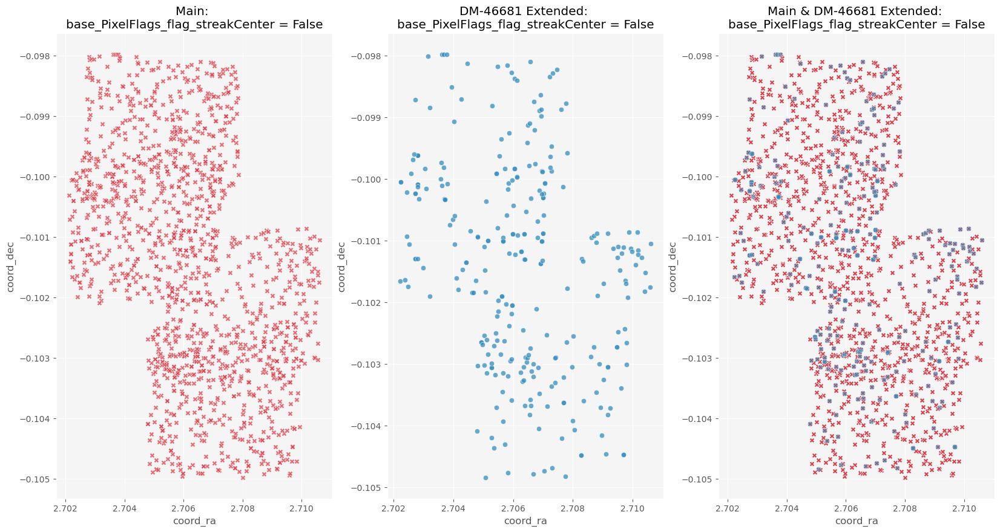

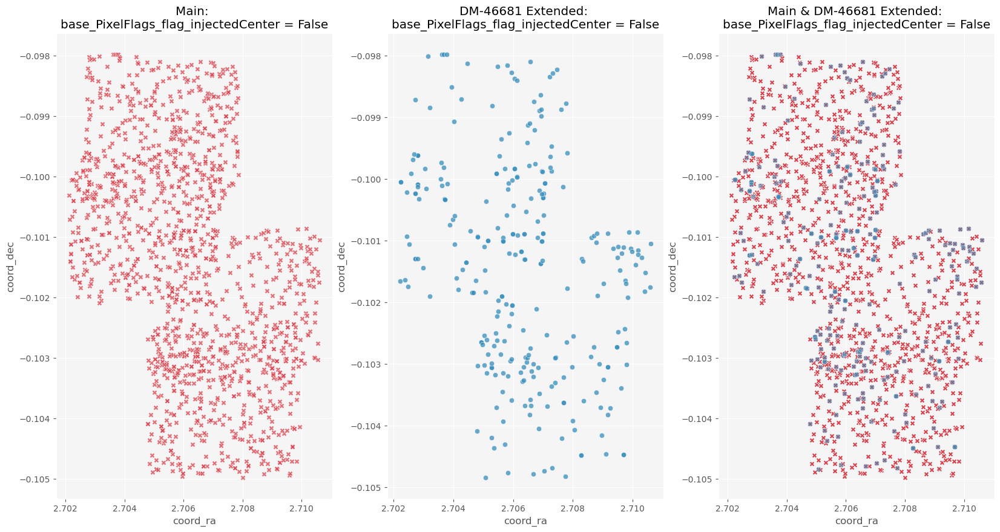

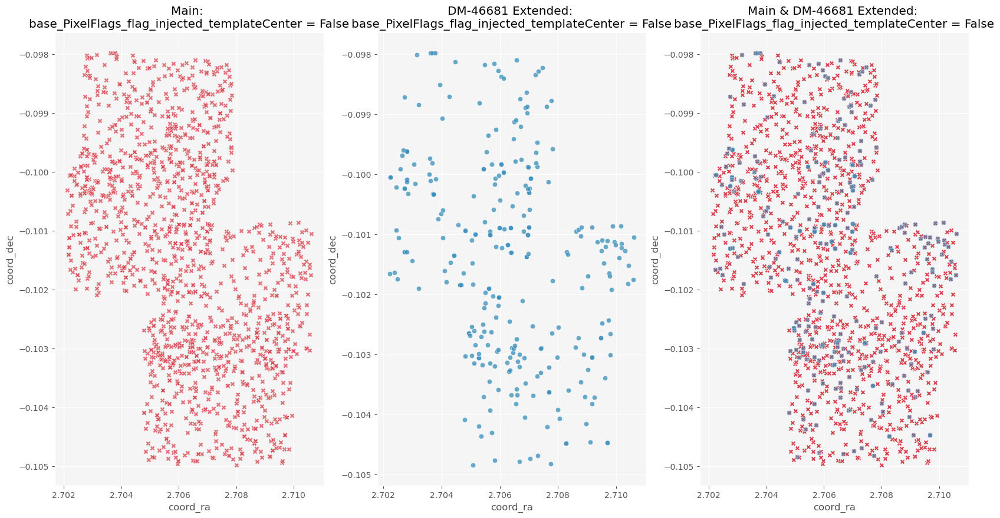

In [69]:
visualFlagComparison(mainSources, updatedSourcesExtFalse, 'Main', 'DM-46681 Extended', False, flagList)

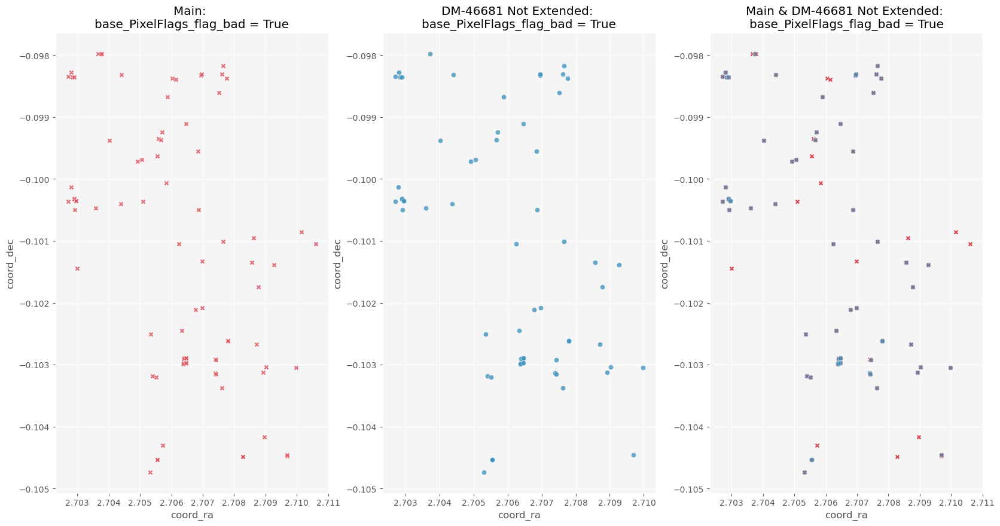

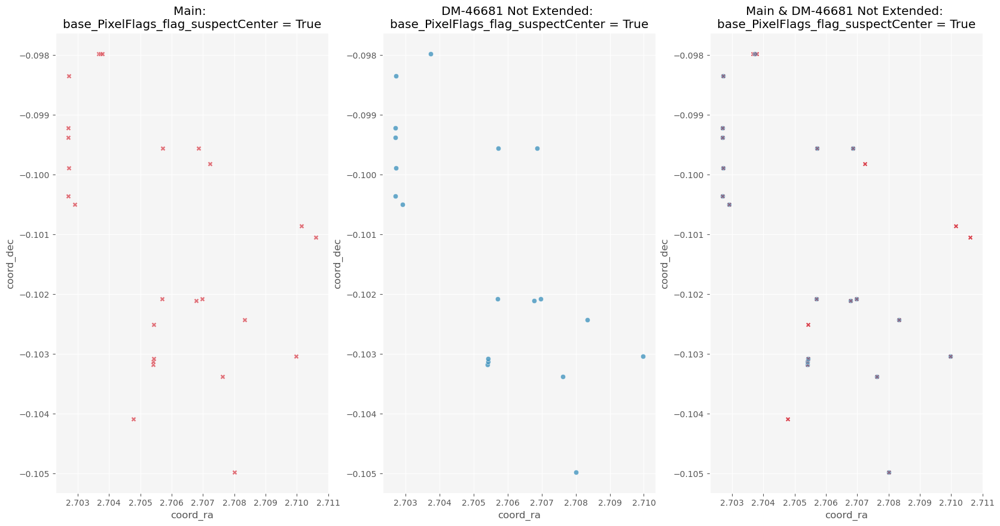

In [70]:
visualFlagComparison(mainSources, updatedSourcesExtTrue, 'Main', 'DM-46681 Not Extended', True, flagList)

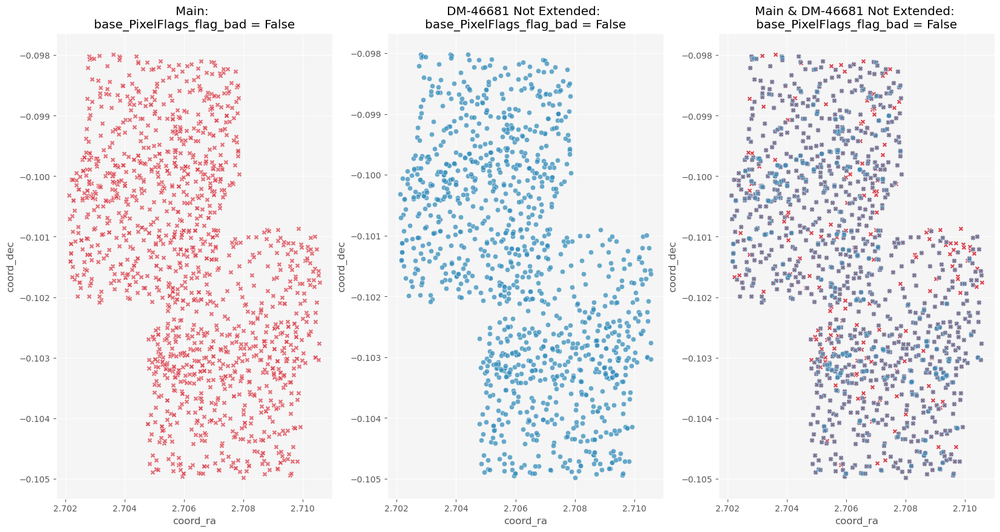

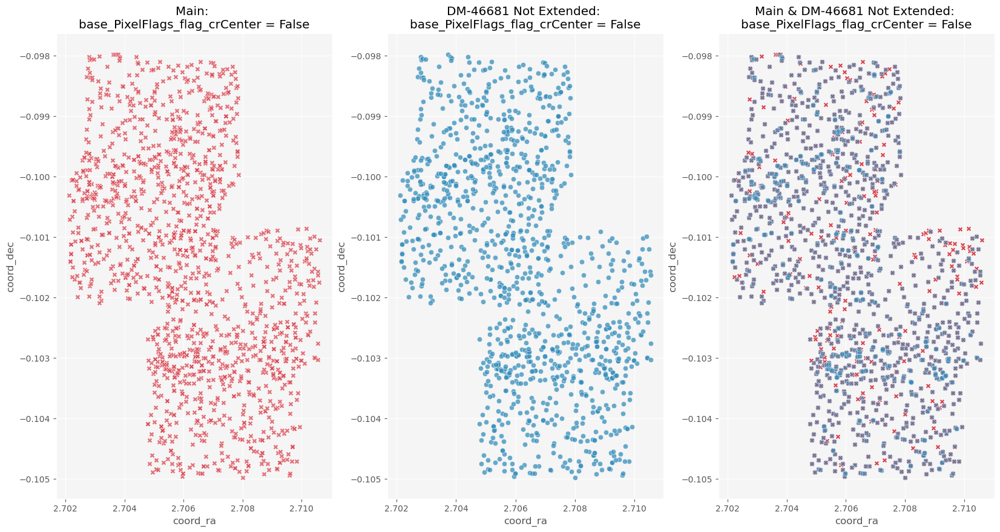

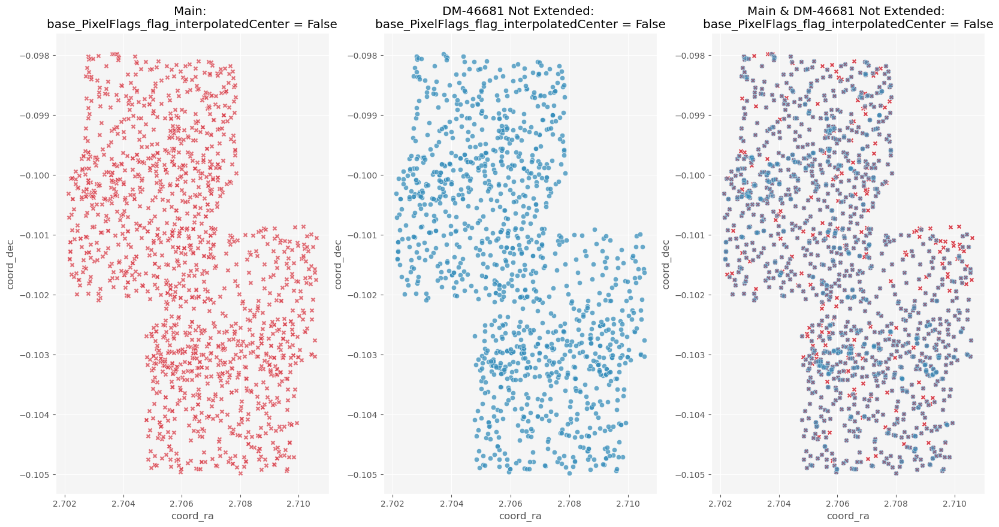

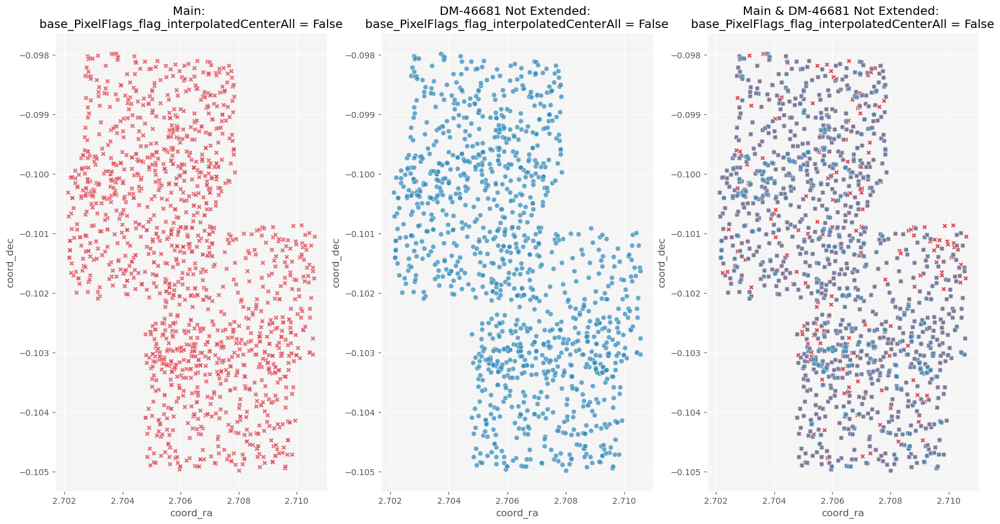

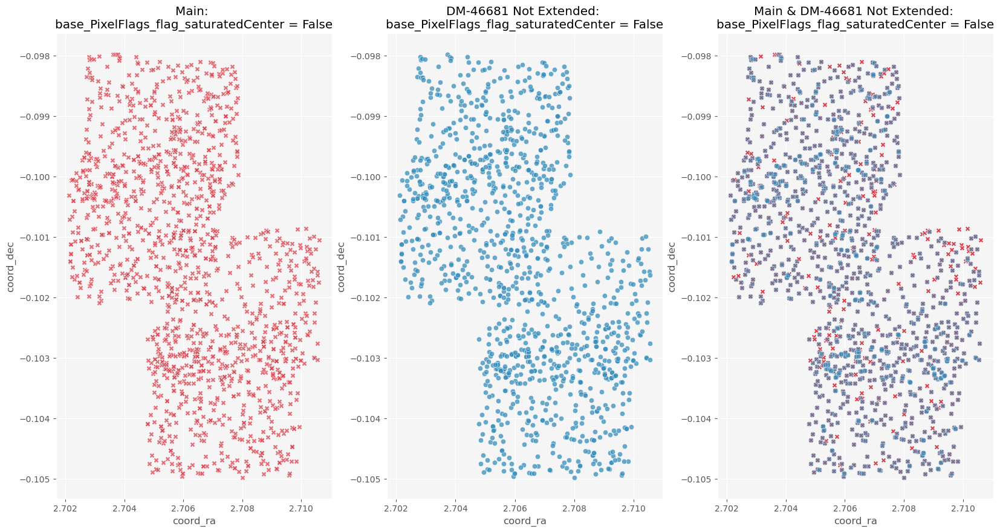

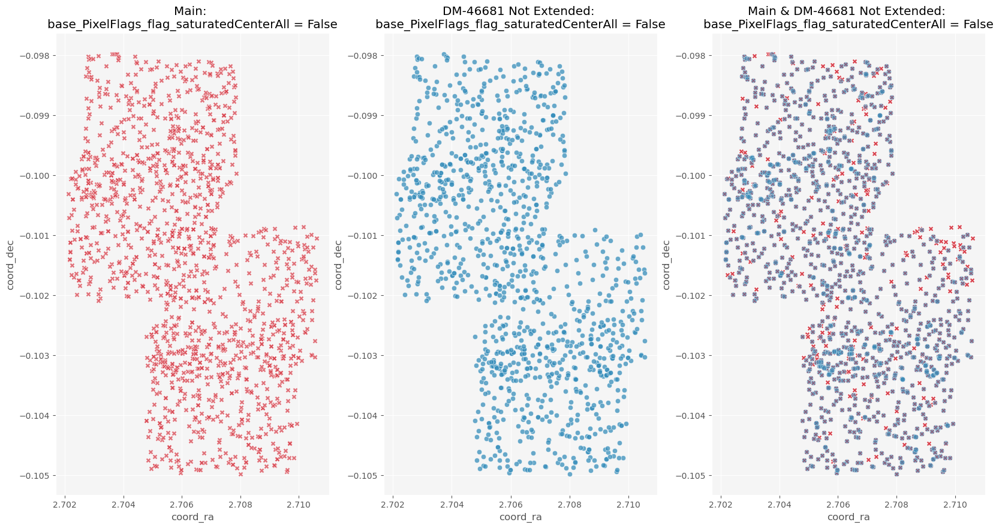

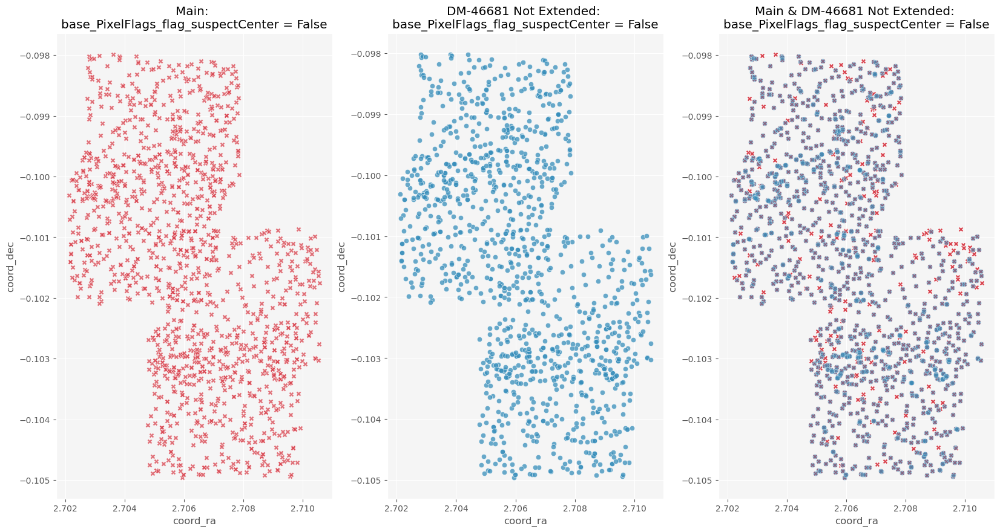

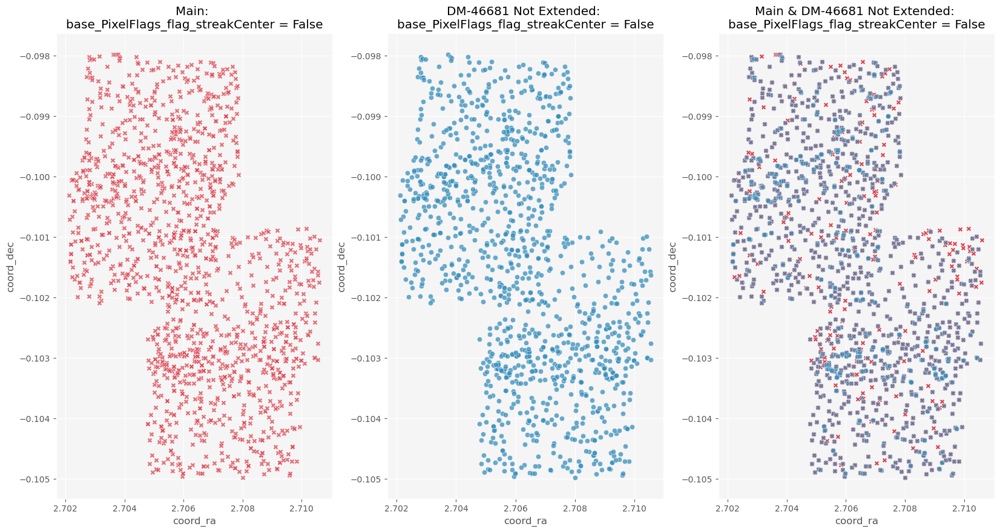

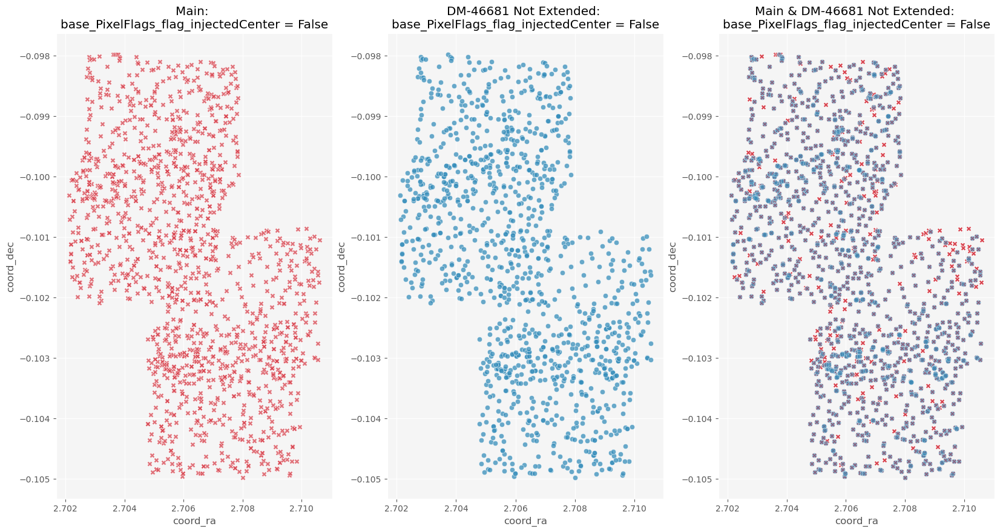

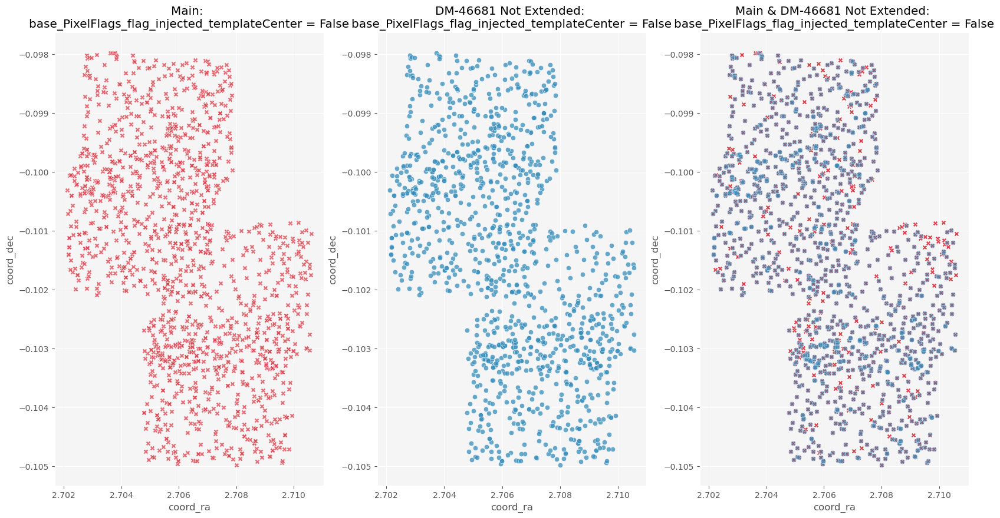

In [71]:
visualFlagComparison(mainSources, updatedSourcesExtTrue, 'Main', 'DM-46681 Not Extended', False, flagList)